In [148]:
import os,sys
import numpy as np
from scipy.spatial import distance
import matplotlib.pyplot as plt
plt.style.use(['science','ieee', "no-latex", "std-colors"])
ars_path = "/home/unibas/boittier/AdjustReference-System/"
sys.path.insert(1, ars_path)
from ARS import *
import numpy as np
import pandas as pd

def load_dih(name, scan, cubedir, cube_name, frame_file):
    charge_positions = []
    dih = []
    names = []
    for i in range(37):
        if i == 0:
            xyz_file_name = "../FDCM/{name}/local_0_fit.xyz".format(name=name)
            names.append(xyz_file_name)
        else:
            xyz_file_name = "../FDCM/{name}/{i}_{j}/local_{name}-{i}-{j}.xyz".format(name=name, i=i-1, j=i)
            names.append(xyz_file_name)
        
        pcube = "{cubedir}/{j}_{scan}/{cube_name}".format(cubedir=cubedir, name=name, scan=scan, 
                                                                          cube_name=cube_name, j=i)
        
        ARS_obj = ARS(xyz_file_name, pcube, frame_file)
        indices = [int(x)-1 for x in scan.split("_")[1:-1]]
        dih.append(ARS_obj.get_dih(*indices))
        charge_positions.append(ARS_obj.c_positions)

    return charge_positions, dih, names

cubedir = "/home/unibas/boittier/RDKit_G2/B.pdb/SCAN_1_2_3_4_S_36_10.0"
frame_file = "../pydcm-1.2/models/test3/frames.txt"    
cp_fbuta, dih_fbuta, forward_names = load_dih("fbuta-5", "SCAN_1_2_3_4_F", cubedir, "B.p.cube", frame_file)


cubedir = "/home/unibas/boittier/RDKit_G2/B.pdb/SCAN_1_2_3_4_S_36_-10.0"
frame_file = "../pydcm-1.2/models/test3/frames.txt"    
cp_fbuta_neg, dih_fbuta_neg, backwards_names = load_dih("fbuta-neg-5", "SCAN_1_2_3_4_F", cubedir, "B.p.cube", frame_file)


In [149]:
cp = np.array(cp_fbuta)
cp.shape

(37, 25, 3)

In [295]:
cp = np.array(cp_fbuta)

data_dict = {"dih": [round(int(x)/10)*10  for x in dih_fbuta]}

for i, axis in enumerate(["x", "y", "z"]):
    for c in range(25):
        data_dict[f"{axis}_c{c}"] = cp[:,c,i] 
            
df_forward = pd.DataFrame(data_dict)
df_forward["name"] = forward_names
df_forward = df_forward.sort_values("dih")


cp = np.array(cp_fbuta_neg)
data_dict = {"dih": [round(int(x)/10)*10 for x in dih_fbuta_neg]}

for i, axis in enumerate(["x", "y", "z"]):
    for c in range(25):
        data_dict[f"{axis}_c{c}"] = cp[:,c,i] 
            
df_backward = pd.DataFrame(data_dict)
df_backward["name"] = backwards_names
df_backward = df_backward.sort_values("dih")


df_concat = pd.concat((df_backward, df_forward))
df_concat = df_concat.sort_values("dih")
# df_concat

In [161]:
# for x, y in zip(df_backward["dih"], df_forward["dih"]):
#     print(x, y)


In [162]:
df_merge = pd.merge(df_backward, df_forward, on='dih')

keys = ["dih"]
for i, axis in enumerate(["x", "y", "z"]):
    for c in range(25):
        keys.append(f"{axis}_c{c}")
for i, axis in enumerate(["x", "y", "z"]):
    for c in range(25):
        df_merge[f"{axis}_c{c}"] = (df_merge[f"{axis}_c{c}_x"] + df_merge[f"{axis}_c{c}_y"]) / 2
df_average = df_merge[keys]
df_average = df_average.sort_values("dih")

In [241]:
# df_forward

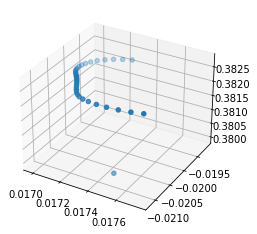

In [53]:
# %matplotlib widget
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
c_number = 9
df = df_average
ax.scatter(df[f"x_c{c_number}"], df[f"y_c{c_number}"], df[f"z_c{c_number}"])

In [296]:
import numpy, scipy.optimize

def fit_sin(tt, yy):
    '''Fit sin to the input time sequence, and return fitting parameters "amp", "omega", "phase", "offset", "freq", "period" and "fitfunc"'''
    tt = numpy.array(tt)
    yy = numpy.array(yy)
    ff = numpy.fft.fftfreq(len(tt), (tt[1]-tt[0]))   # assume uniform spacing
    Fyy = abs(numpy.fft.fft(yy))
    guess_freq = abs(ff[numpy.argmax(Fyy[1:])+1])   # excluding the zero frequency "peak", which is related to offset
    guess_amp = numpy.std(yy) * 2.**0.5
    guess_offset = numpy.mean(yy)
    guess = numpy.array([guess_amp, 2.*numpy.pi*guess_freq, 0., guess_offset])

    def sinfunc(t, A, w, p, c):  return A * numpy.sin(w*t + p) + c
    popt, pcov = scipy.optimize.curve_fit(sinfunc, tt, yy, p0=guess, maxfev=10000)
    A, w, p, c = popt
    f = w/(2.*numpy.pi)
    fitfunc = lambda t: A * numpy.sin(w*t + p) + c
    return {"amp": A, "omega": w, "phase": p, "offset": c, 
            "freq": f, "period": 1./f, "fitfunc": fitfunc, "maxcov": numpy.max(pcov), "rawres": (guess,popt,pcov)}


def plot_charge(c_number, df, prefix):
    fig, ax = plt.subplots(3,1,  sharex=True)
    #df = df.drop(35)
    ax[0].scatter(df["dih"], df[f"x_c{c_number}"], s=0.5, c="red")
    ax[1].scatter(df["dih"], df[f"y_c{c_number}"], s=0.5, c="green")
    ax[2].scatter(df["dih"], df[f"z_c{c_number}"], s=0.5, c="blue")
#     plt.show()

    fit_x = fit_sin(df["dih"], df[f"x_c{c_number}"])
    ax[0].plot(df["dih"], fit_x["fitfunc"](df["dih"]), "--", c="k", linewidth=0.675)
    fit_y = fit_sin(df["dih"], df[f"y_c{c_number}"])
    ax[1].plot(df["dih"], fit_y["fitfunc"](df["dih"]), "--", c="k", linewidth=0.675)
    fit_z = fit_sin(df["dih"], df[f"z_c{c_number}"])
    ax[2].plot(df["dih"], fit_z["fitfunc"](df["dih"]), "--", c="k", linewidth=0.675)
    
    ax[0].plot(df["dih"], df[f"x_c{c_number}"], c="red")
    ax[1].plot(df["dih"], df[f"y_c{c_number}"], c="green")
    ax[2].plot(df["dih"], df[f"z_c{c_number}"], c="blue")
    
    ax[0].set_ylabel("$e_x$")
    ax[1].set_ylabel("$e_y$")
    ax[2].set_ylabel("$e_z$")
    plt.xlabel('$\Phi$')
    for i in range(3):
        plt.text(0.5, 0.5, f"$q_{{{c_number+1}}}$", 
                 rotation=0, verticalalignment="center", 
                 transform= ax[i].transAxes)
    plt.savefig("figs/charge_position_analysis/{0}-fbuta_sym_c{1}.pdf".
                format(prefix, c_number+1))
    
    plt.xlim(-180,180)
    plt.show()


In [359]:
# df_b_sym_concat

In [360]:
backwards_sym = df_backward.iloc[-2:16:-1]
first_point = backwards_sym[0:1]
first_point["dih"] = [180]
middle_point = first_point.copy()
middle_point["dih"] = [0]

backwards_sym_rev = backwards_sym.sort_values("dih")
backwards_sym_rev["dih"] = backwards_sym_rev["dih"]*-1
df_b_sym_concat = pd.concat((backwards_sym, backwards_sym_rev))
# df_b_sym_concat

<ipython-input-360-9924be4cbb16>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  first_point["dih"] = [180]


In [306]:

df_f_sym = df_forward.iloc[0:19]
df_f_sym_rev = df_f_sym.sort_values("dih", ascending=False)
df_f_sym_rev["dih"] = df_f_sym_rev["dih"]*-1
df_f_sym_concat = pd.concat((df_f_sym, df_f_sym_rev.iloc[1:]))



df_b_sym_concat = pd.concat((backwards_sym, backwards_sym_rev))
# df_b_sym_concat


<ipython-input-306-a308070e88c1>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a["dih"] = [-180]


In [368]:
df_merge = pd.merge(df_b_sym_concat, df_f_sym_concat, on='dih')

keys = ["dih"]
for i, axis in enumerate(["x", "y", "z"]):
    for c in range(25):
        keys.append(f"{axis}_c{c}")
for i, axis in enumerate(["x", "y", "z"]):
    for c in range(25):
        df_merge[f"{axis}_c{c}"] = (df_merge[f"{axis}_c{c}_x"] + df_merge[f"{axis}_c{c}_y"]) / 2
df_average = df_merge[keys]
df_average_sym_concat = df_average.sort_values("dih")

In [369]:
df_average_sym_concat

,dih,x_c0,x_c1,x_c2,x_c3,x_c4,x_c5,x_c6,x_c7,x_c8,...,z_c15,z_c16,z_c17,z_c18,z_c19,z_c20,z_c21,z_c22,z_c23,z_c24
37,-180,0.065370,-0.173864,-0.083882,-0.510581,-0.239779,0.039830,-0.160260,-0.073035,-0.184180,...,0.296868,-0.404222,-0.226570,0.220534,-0.489127,-0.125919,0.104082,-0.034910,-0.140315,-0.095058
36,-170,0.065376,-0.173855,-0.083894,-0.510554,-0.239764,0.039807,-0.160259,-0.073055,-0.184187,...,0.296873,-0.404188,-0.226555,0.220518,-0.489128,-0.125948,0.104044,-0.034955,-0.140294,-0.095014
35,-160,0.065373,-0.173838,-0.083908,-0.510536,-0.239741,0.039778,-0.160255,-0.073067,-0.184199,...,0.296875,-0.404155,-0.226540,0.220501,-0.489134,-0.125973,0.104002,-0.034994,-0.140275,-0.094969
34,-150,0.065350,-0.173801,-0.083925,-0.510540,-0.239698,0.039731,-0.160245,-0.073063,-0.184218,...,0.296864,-0.404127,-0.226516,0.220479,-0.489158,-0.125978,0.103942,-0.035017,-0.140261,-0.094921
33,-140,0.065300,-0.173735,-0.083943,-0.510579,-0.239622,0.039650,-0.160223,-0.073030,-0.184252,...,0.296832,-0.404104,-0.226482,0.220447,-0.489216,-0.125946,0.103845,-0.035000,-0.140258,-0.094863
32,-130,0.065218,-0.173624,-0.083959,-0.510670,-0.239497,0.039511,-0.160180,-0.072946,-0.184314,...,0.296771,-0.404083,-0.226436,0.220395,-0.489325,-0.125853,0.103687,-0.034925,-0.140272,-0.094787
31,-120,0.065112,-0.173470,-0.083970,-0.510822,-0.239321,0.039287,-0.160104,-0.072784,-0.184428,...,0.296693,-0.404046,-0.226394,0.220331,-0.489476,-0.125705,0.103469,-0.034792,-0.140308,-0.094684
30,-110,0.064986,-0.173253,-0.083970,-0.511064,-0.239071,0.038920,-0.159968,-0.072480,-0.184641,...,0.296624,-0.403953,-0.226390,0.220259,-0.489649,-0.125513,0.103200,-0.034613,-0.140374,-0.094537
29,-100,0.064864,-0.172983,-0.083955,-0.511390,-0.238756,0.038377,-0.159752,-0.071988,-0.184994,...,0.296625,-0.403743,-0.226486,0.220197,-0.489779,-0.125346,0.102947,-0.034461,-0.140481,-0.094327
28,-90,0.064771,-0.172674,-0.083916,-0.511775,-0.238394,0.037719,-0.159476,-0.071356,-0.185442,...,0.296698,-0.403426,-0.226683,0.220157,-0.489834,-0.125251,0.102761,-0.034383,-0.140617,-0.094066


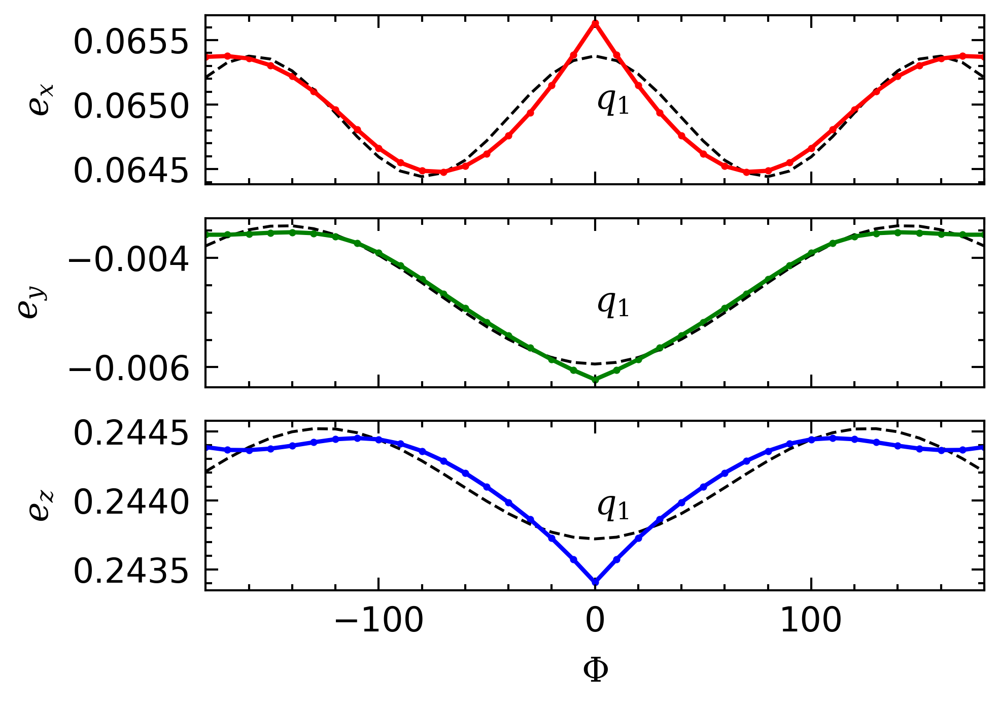

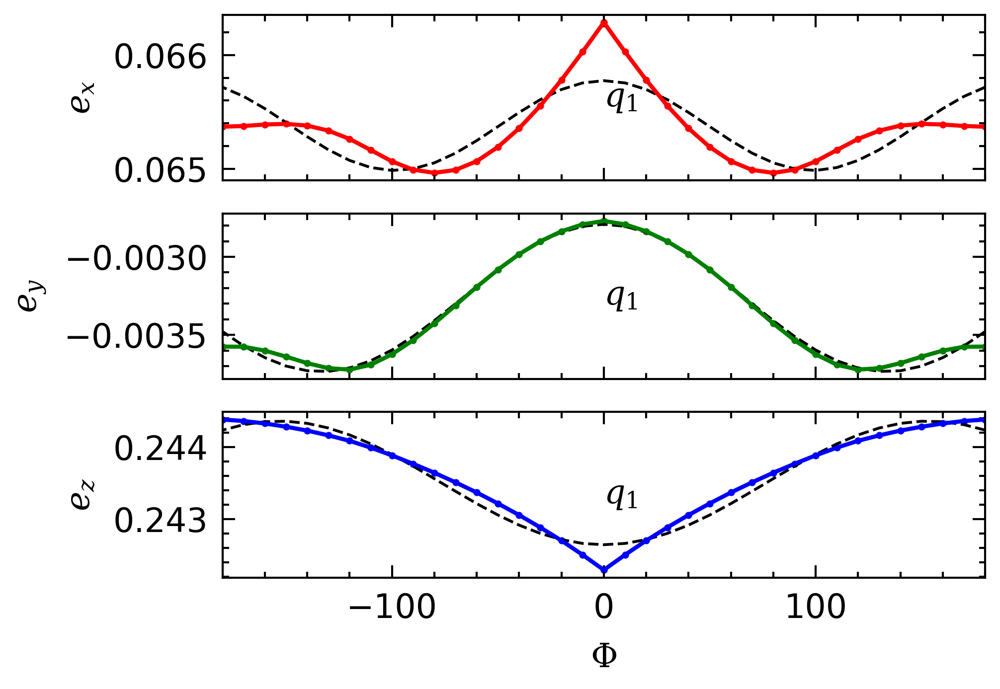

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


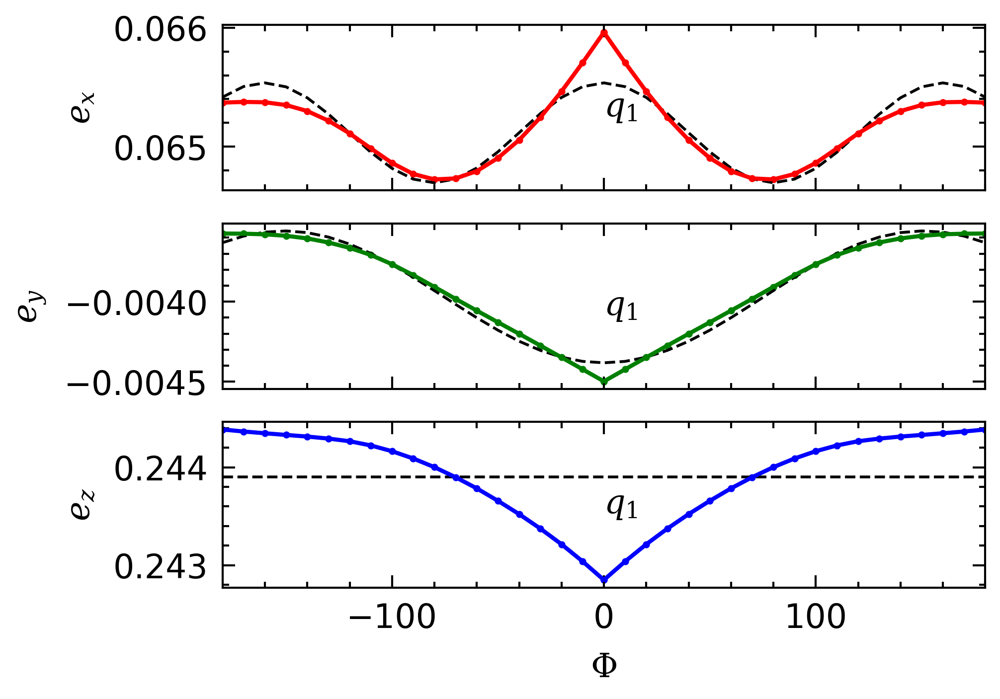

In [370]:
for i in [0]:
    plot_charge(i, df_f_sym_concat, "f")
for i in [0]:
    plot_charge(i, df_b_sym_concat, "b")
for i in [0]:
    plot_charge(i, df_average_sym_concat, "a")

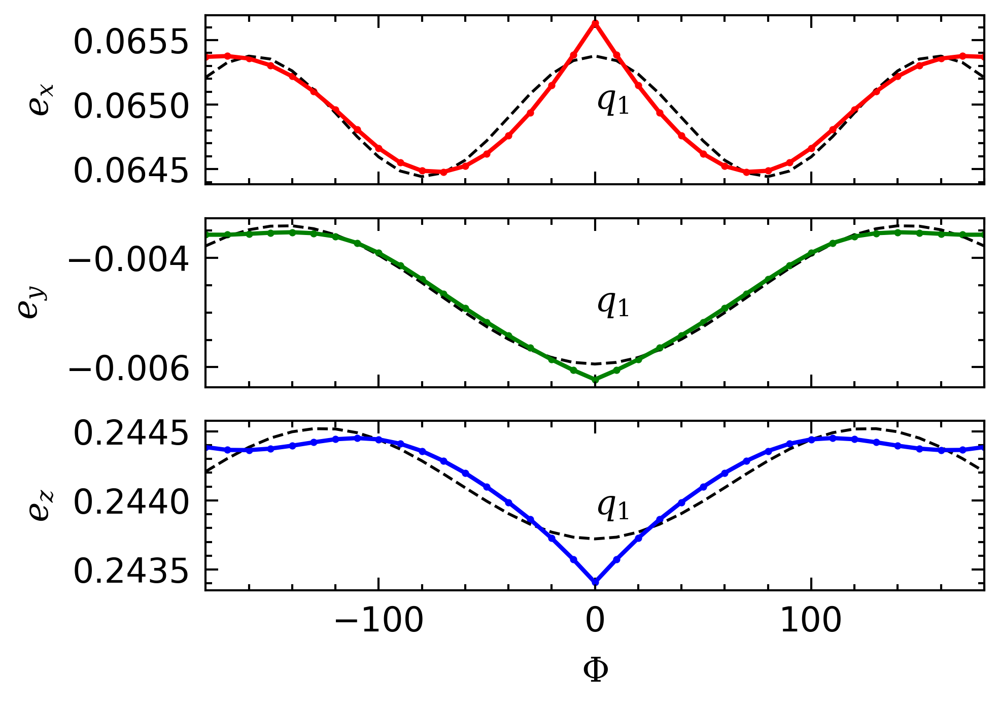

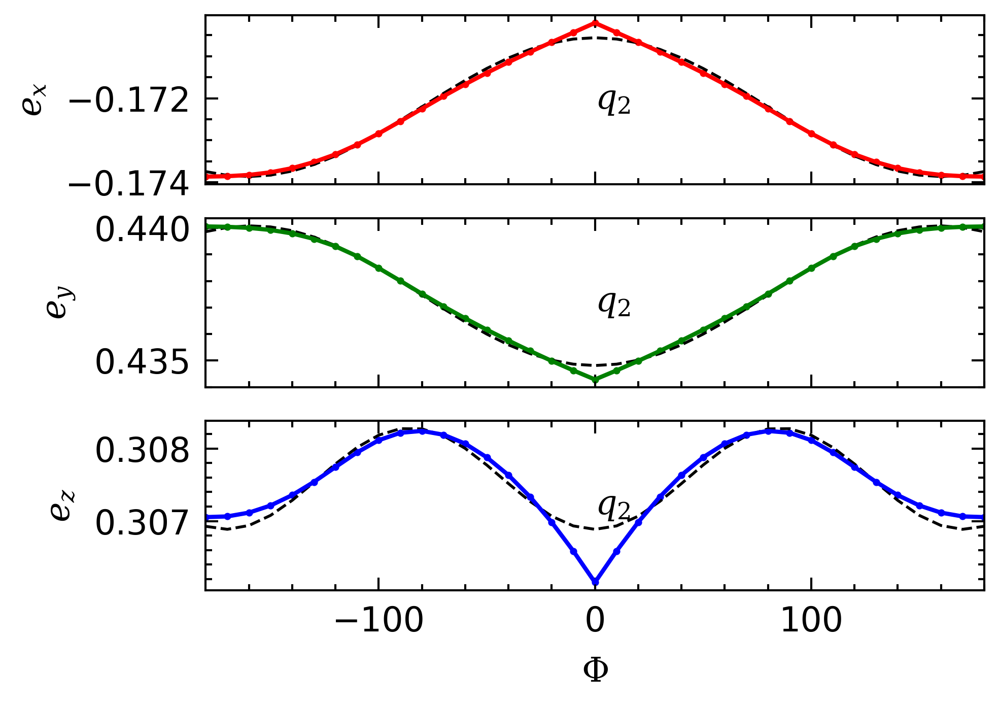

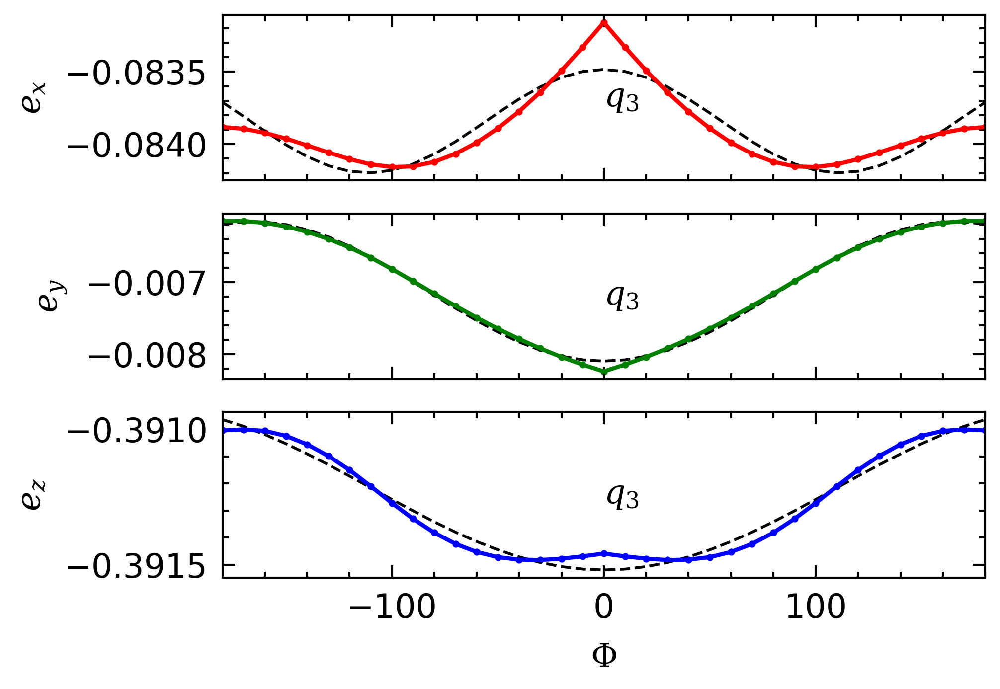

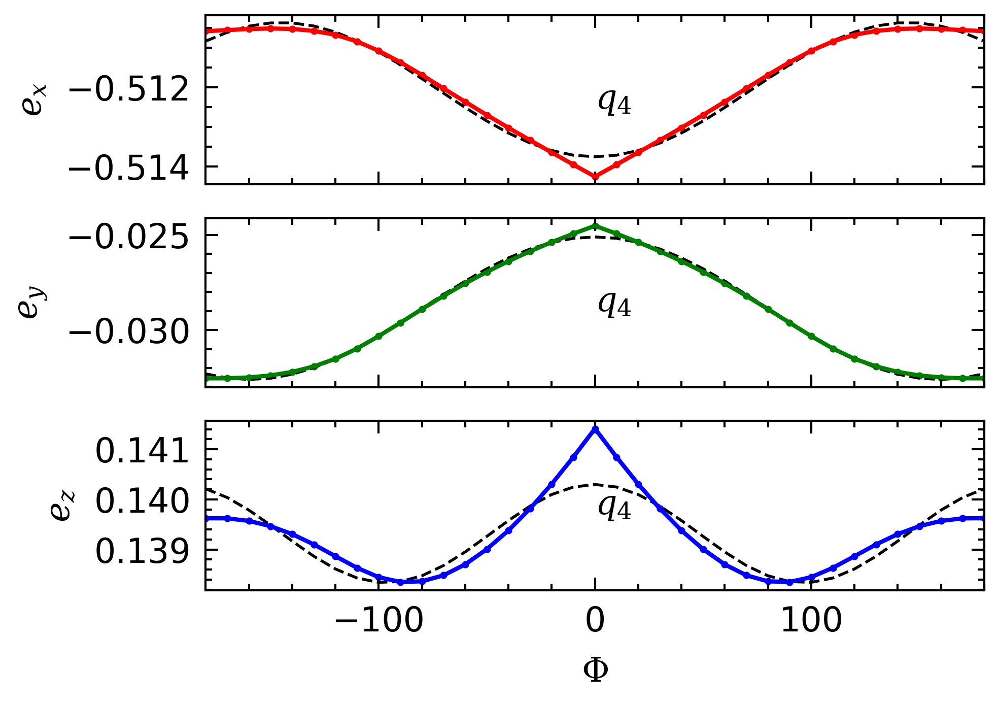

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


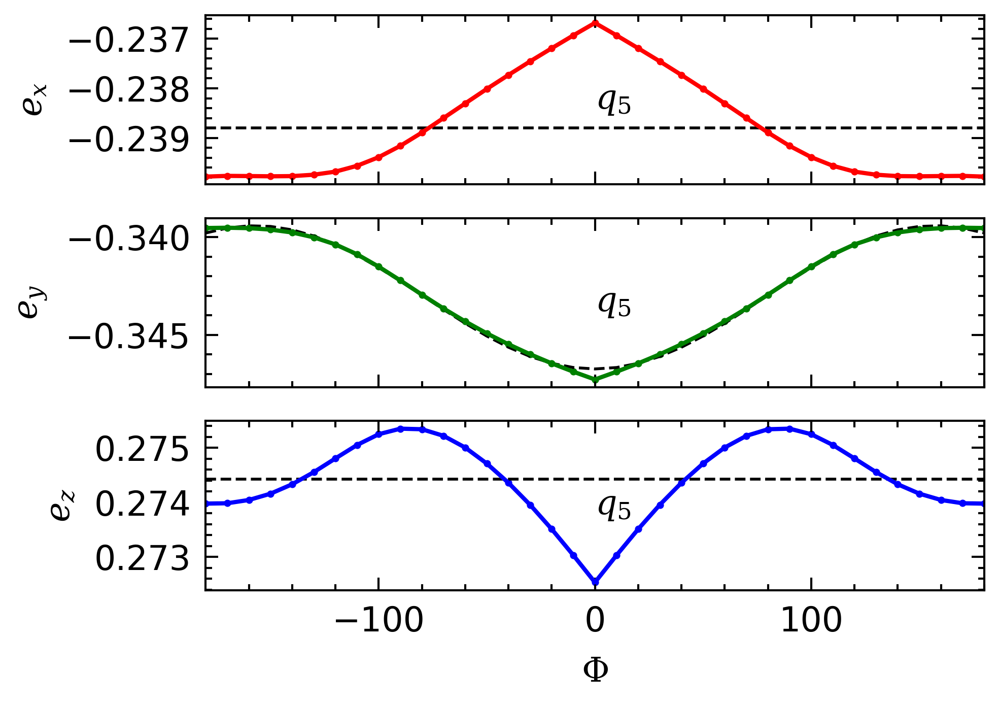

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


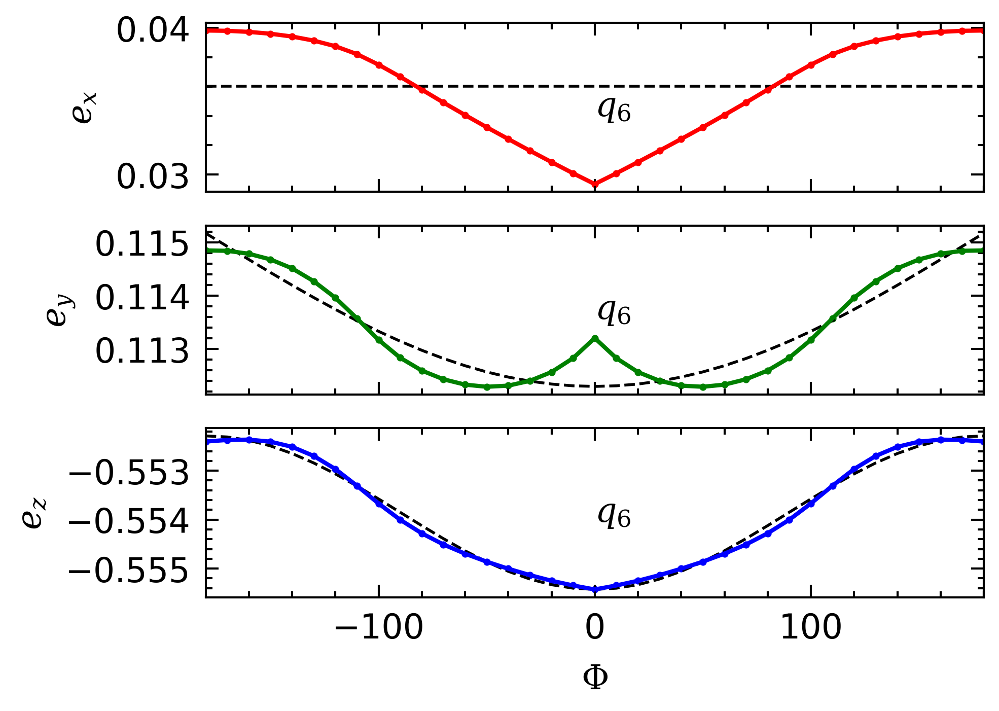

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


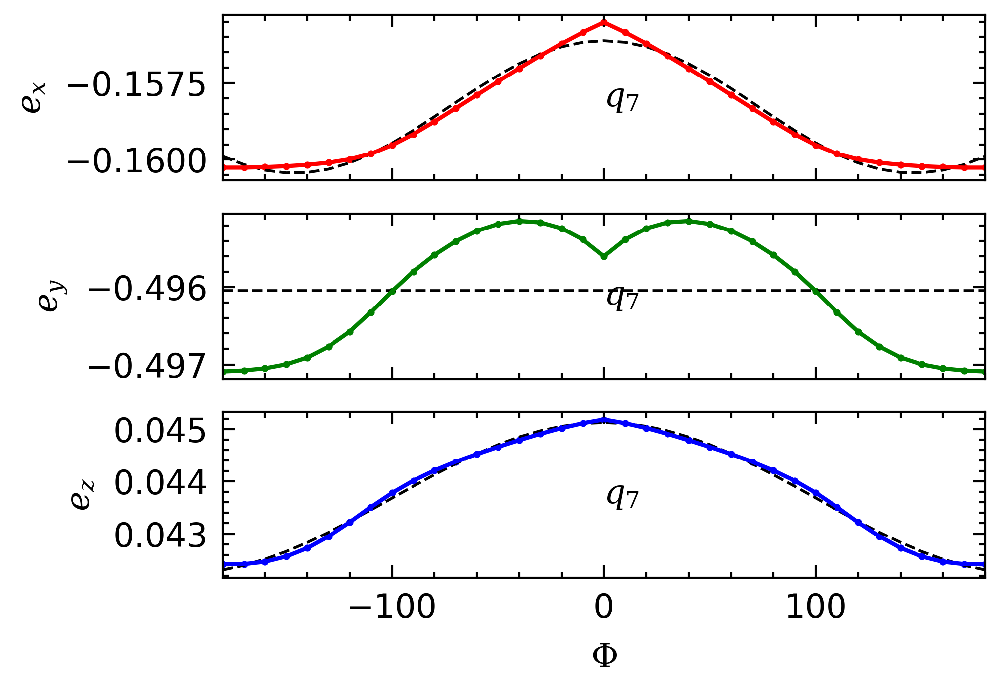

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


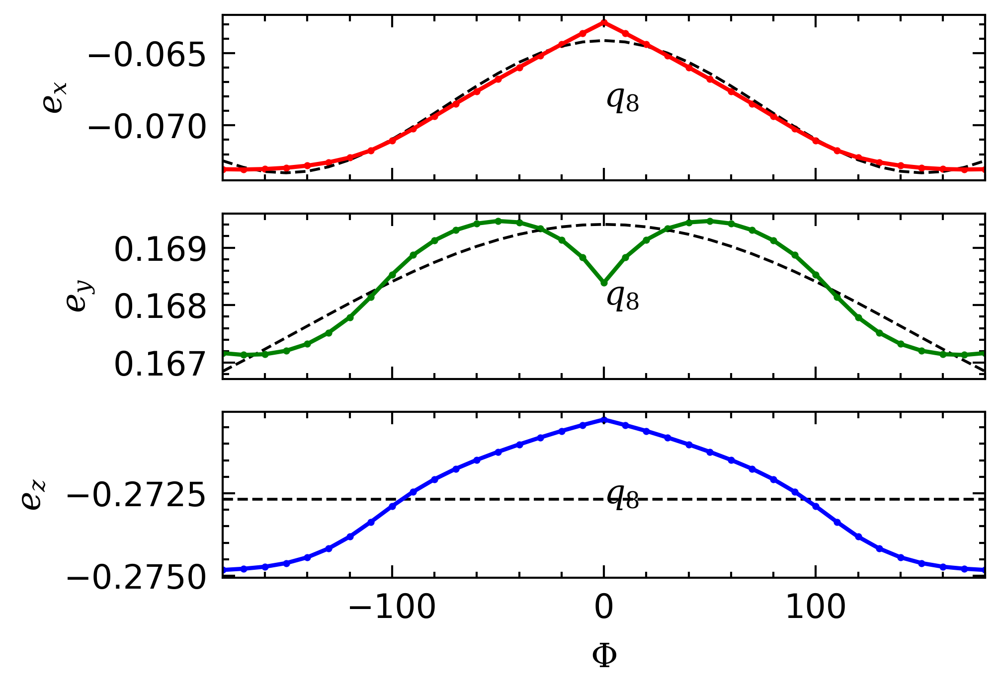

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


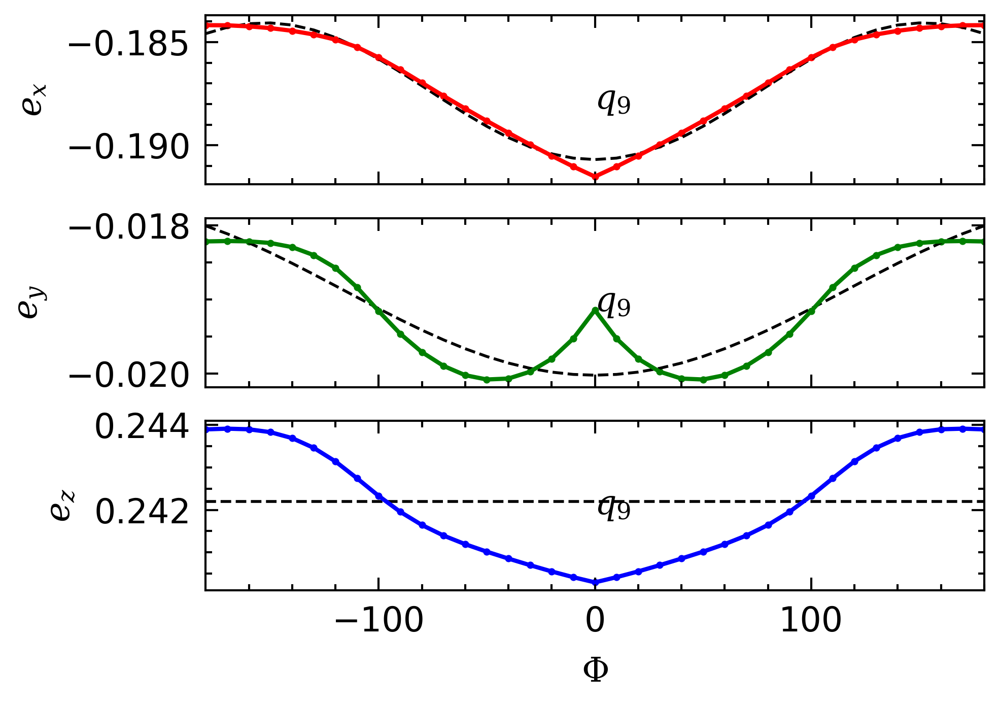

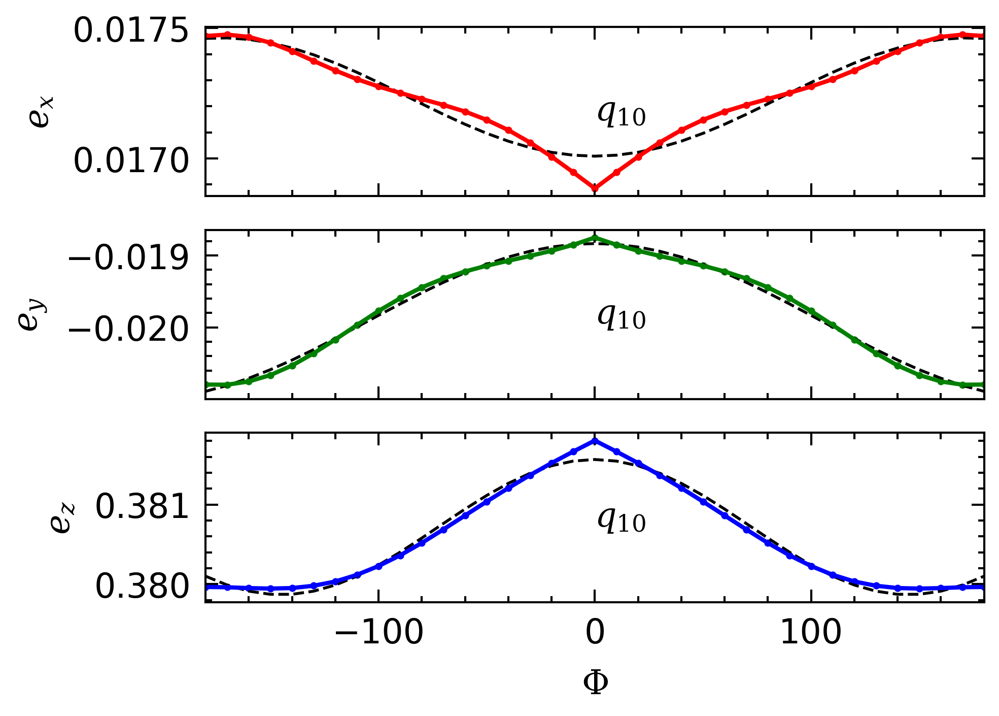

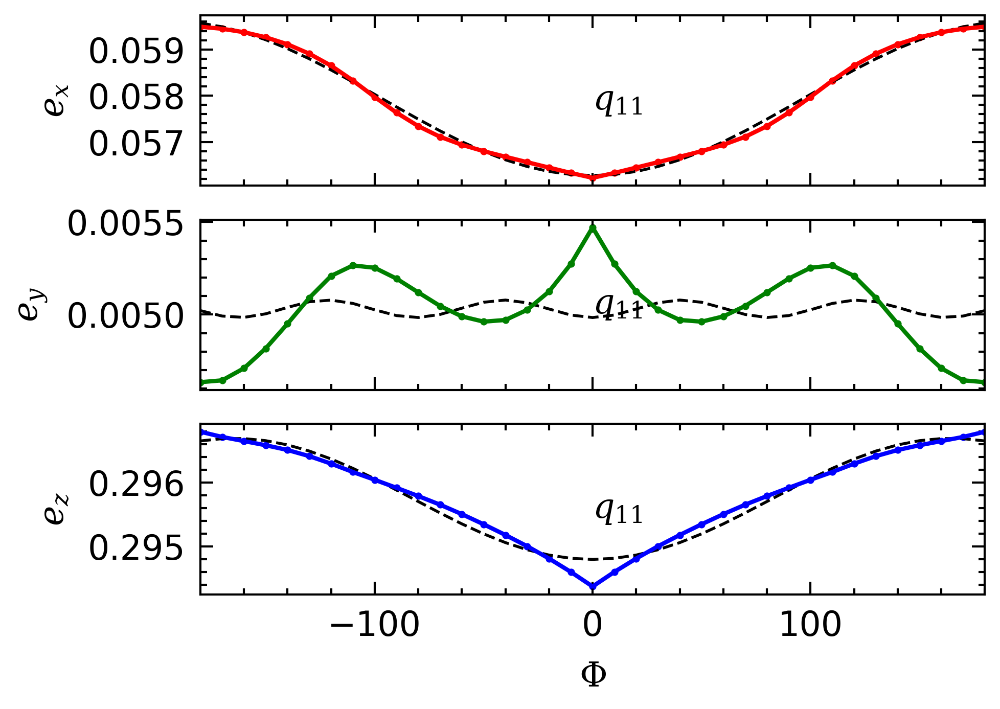

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


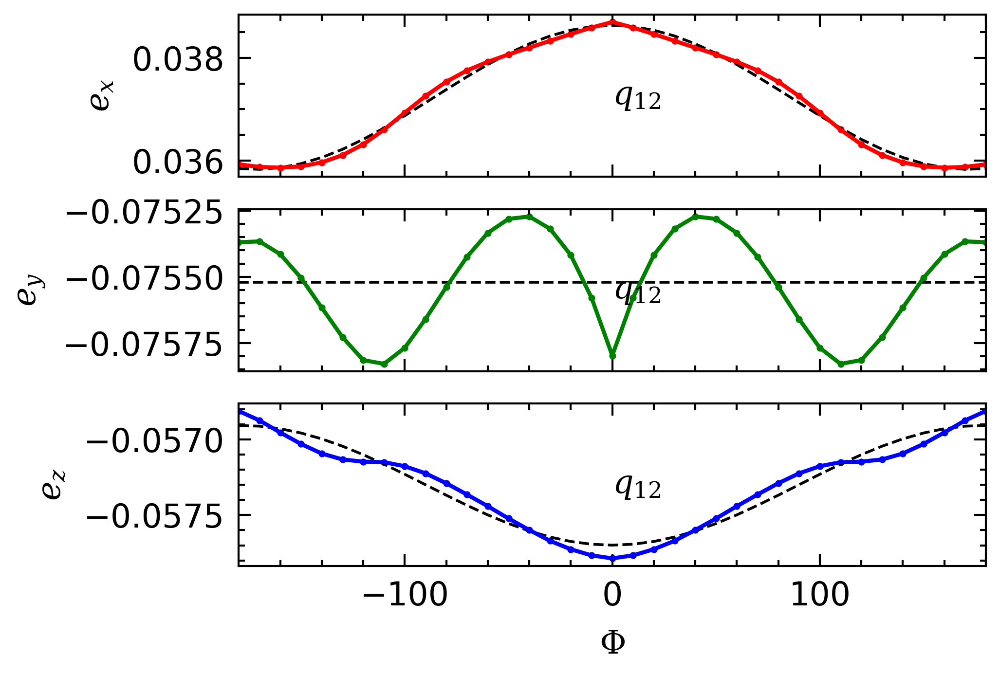

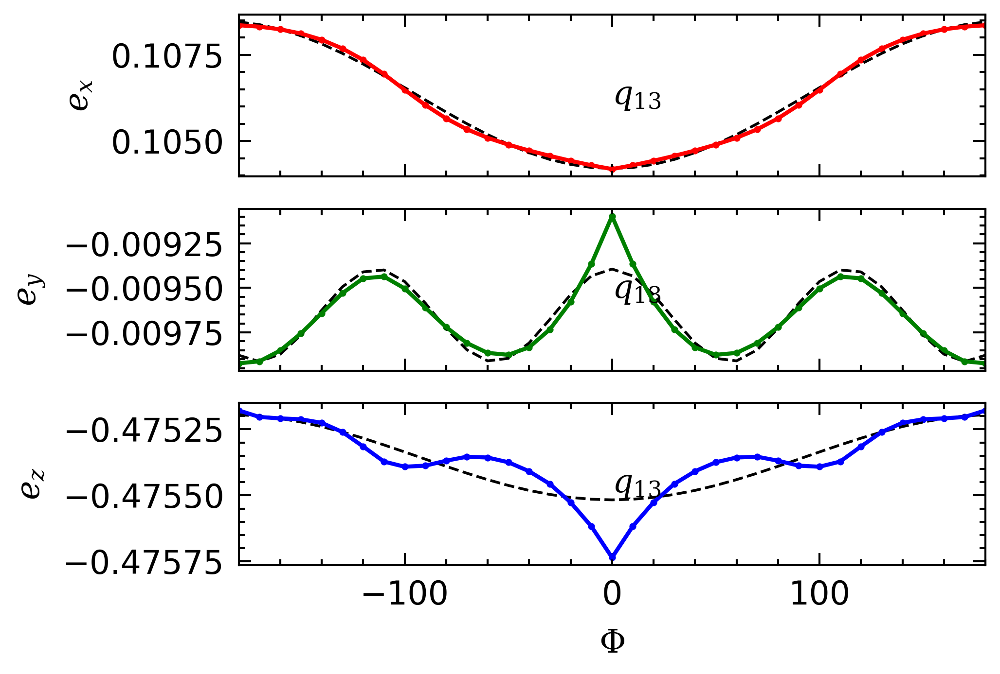

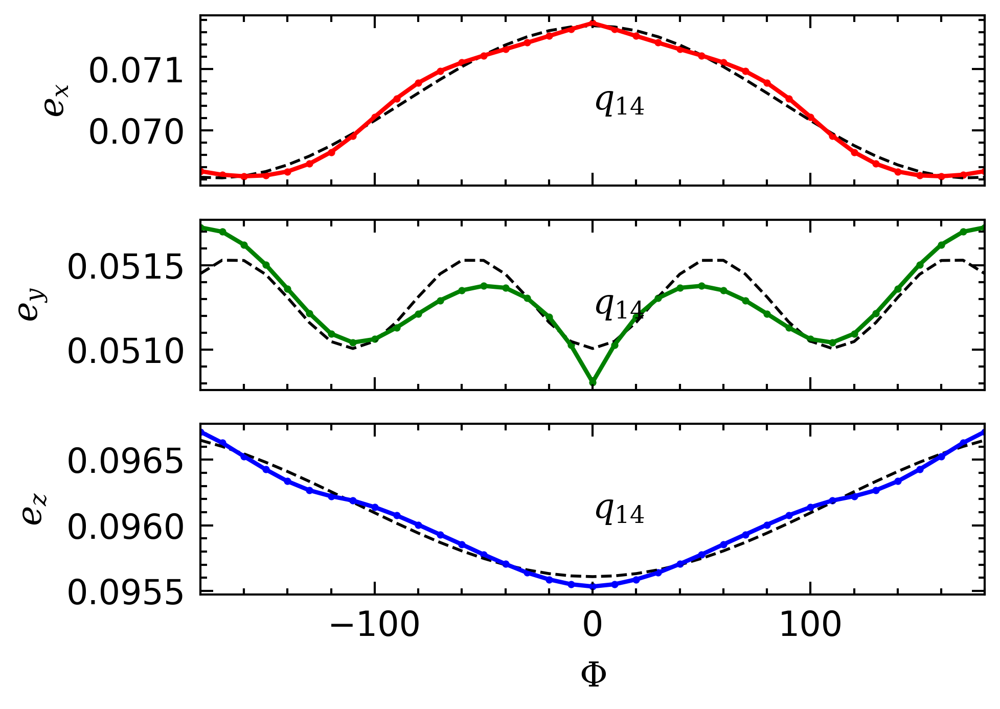

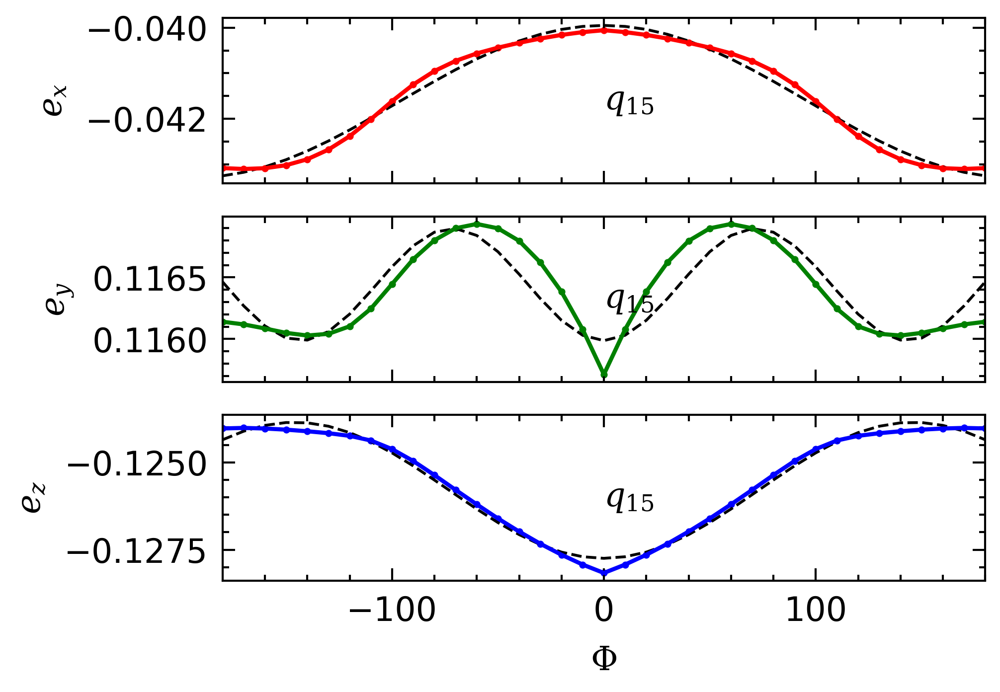

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


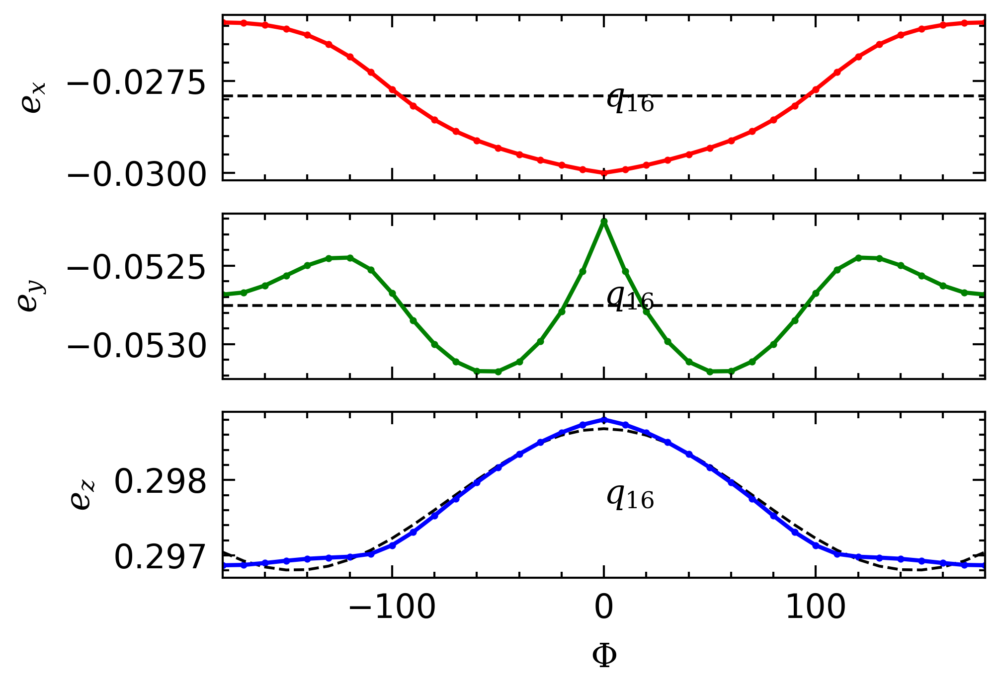

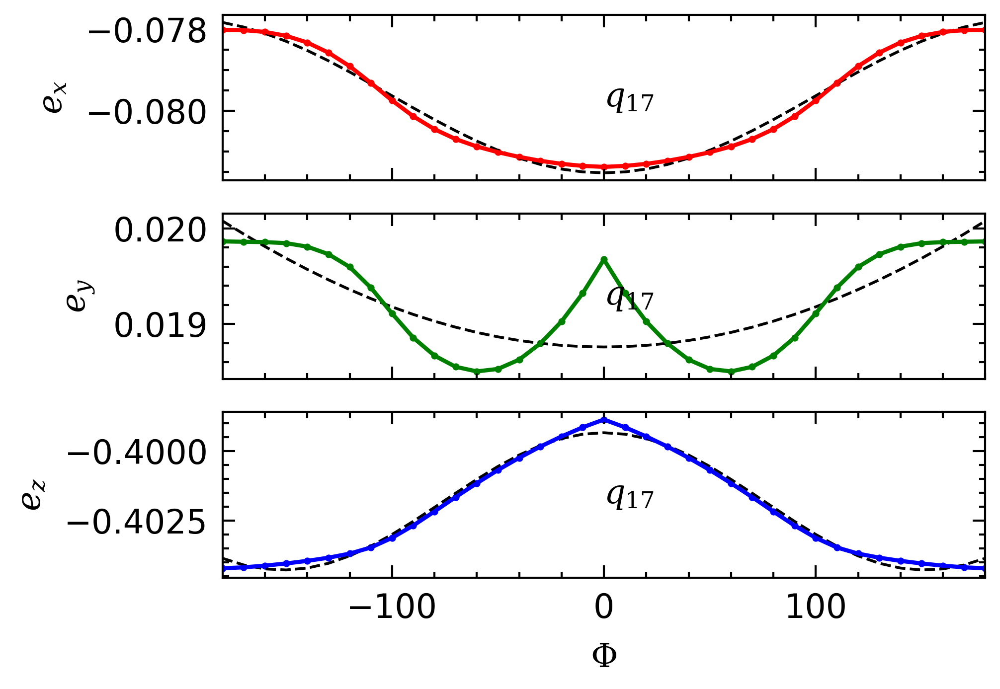

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


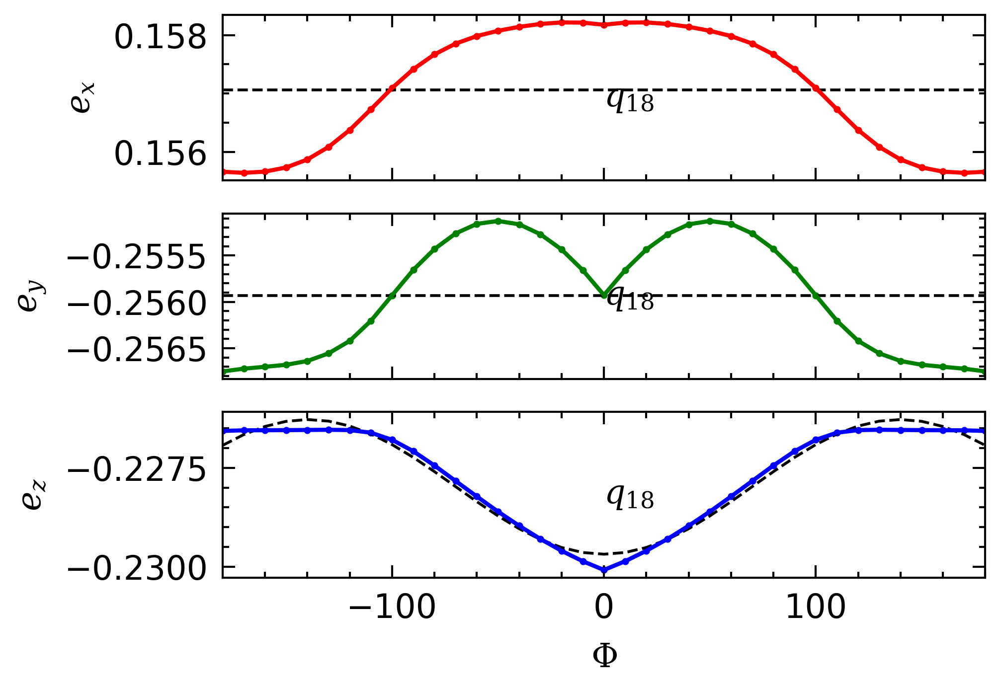

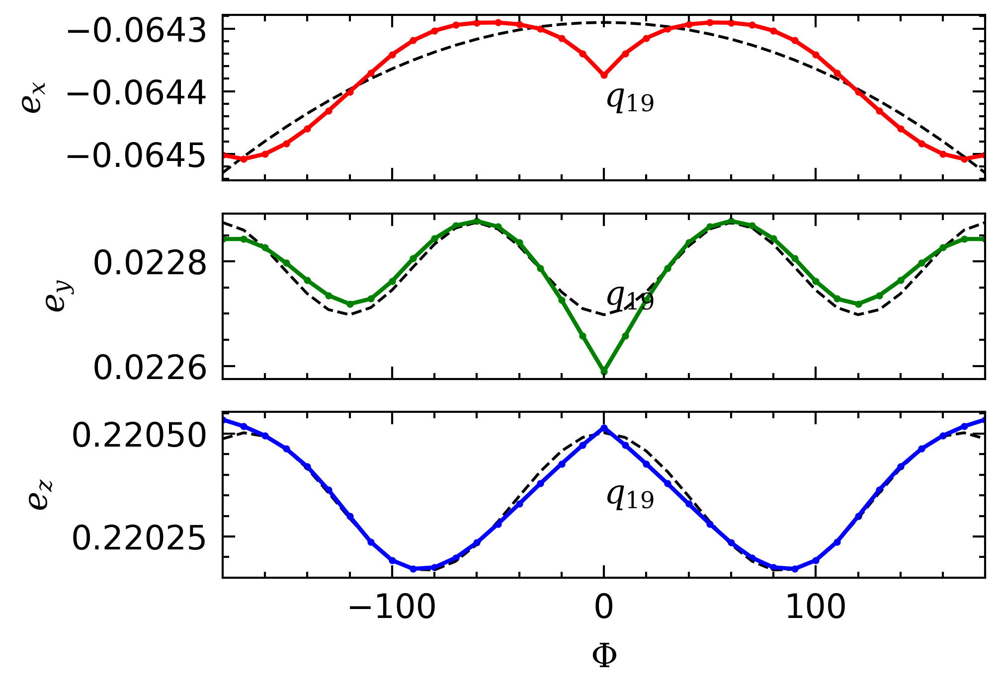

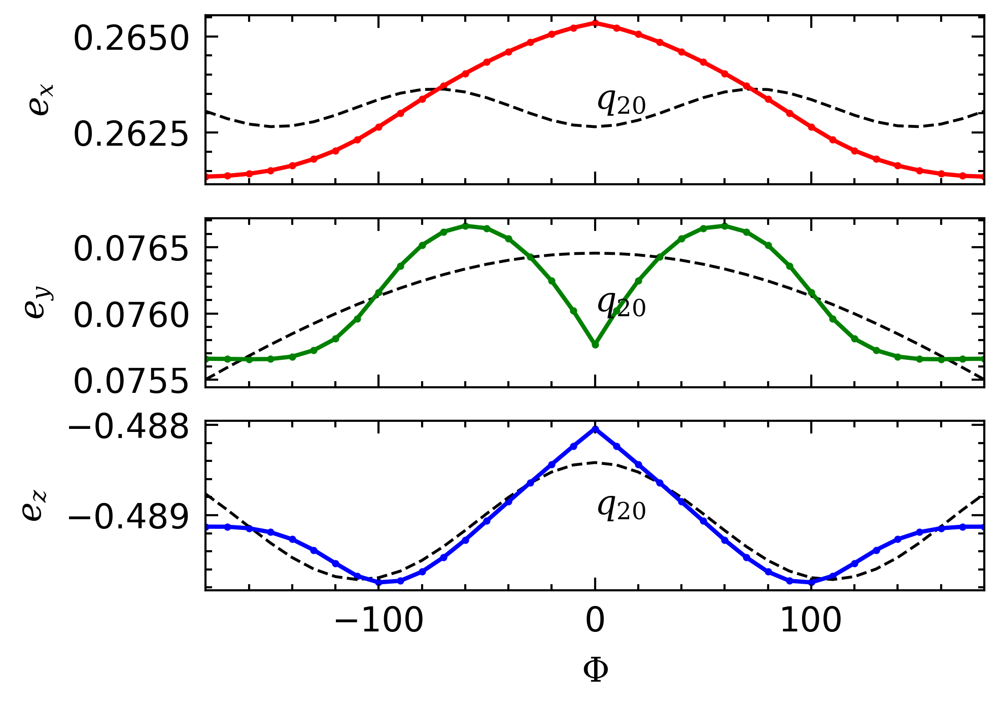

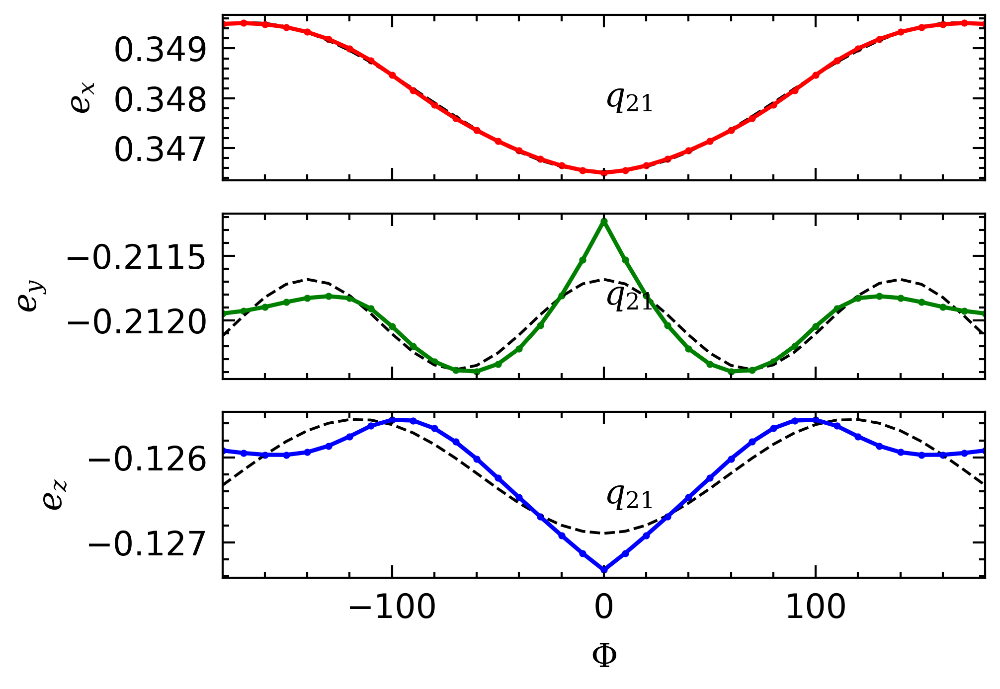

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


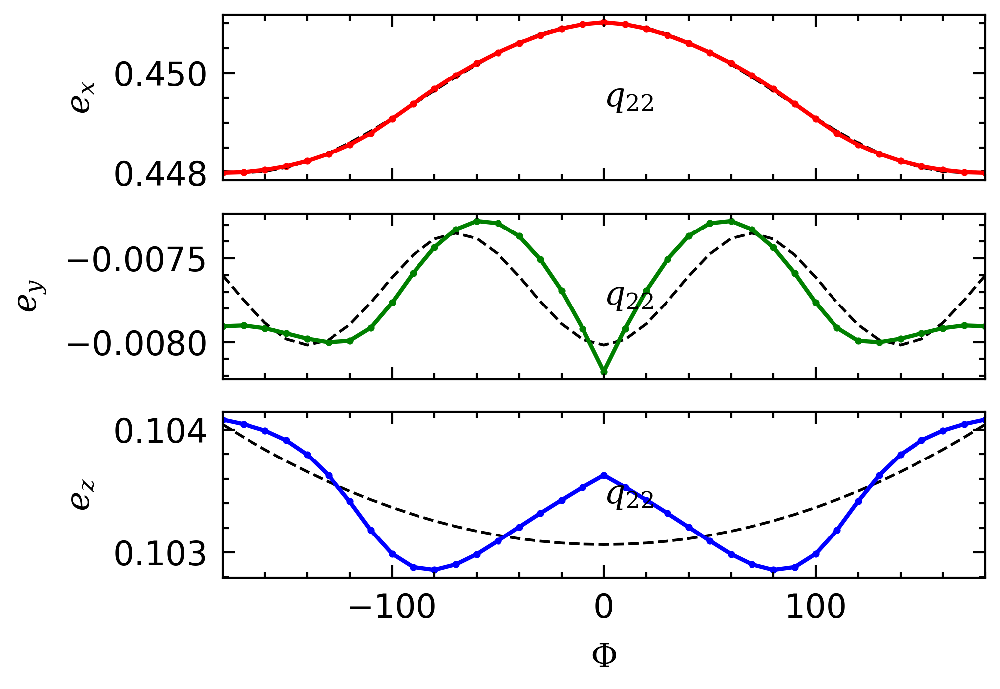

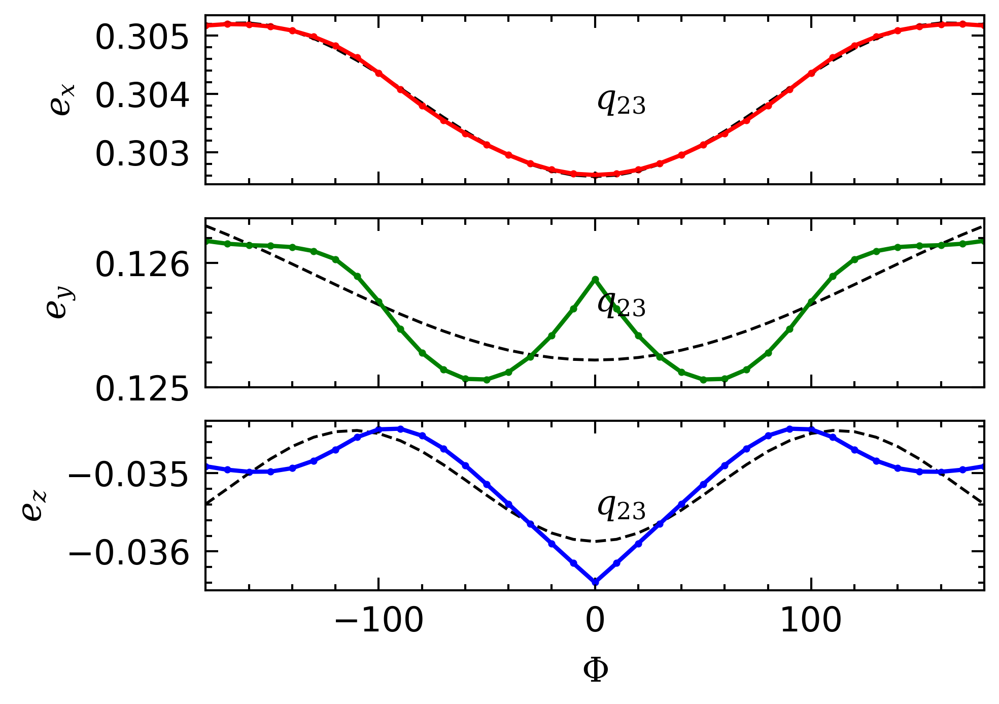

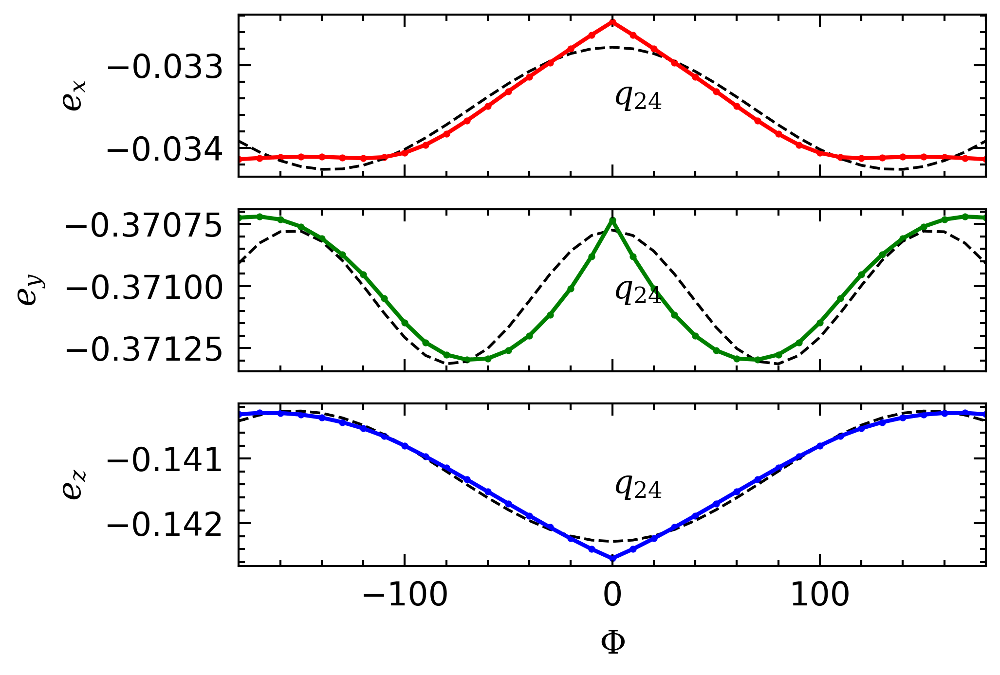

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


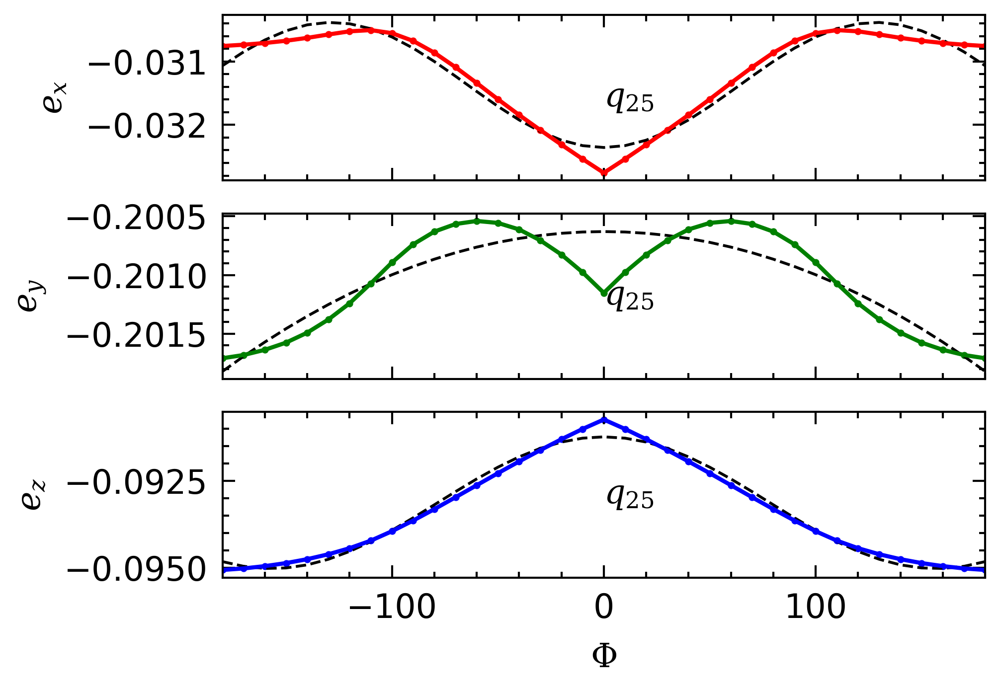

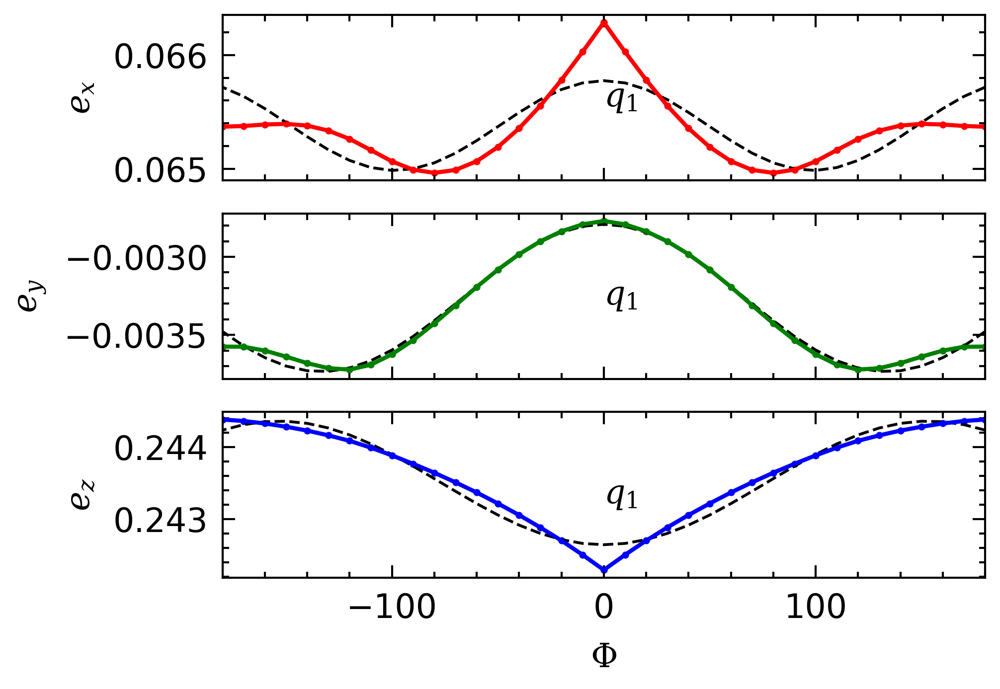

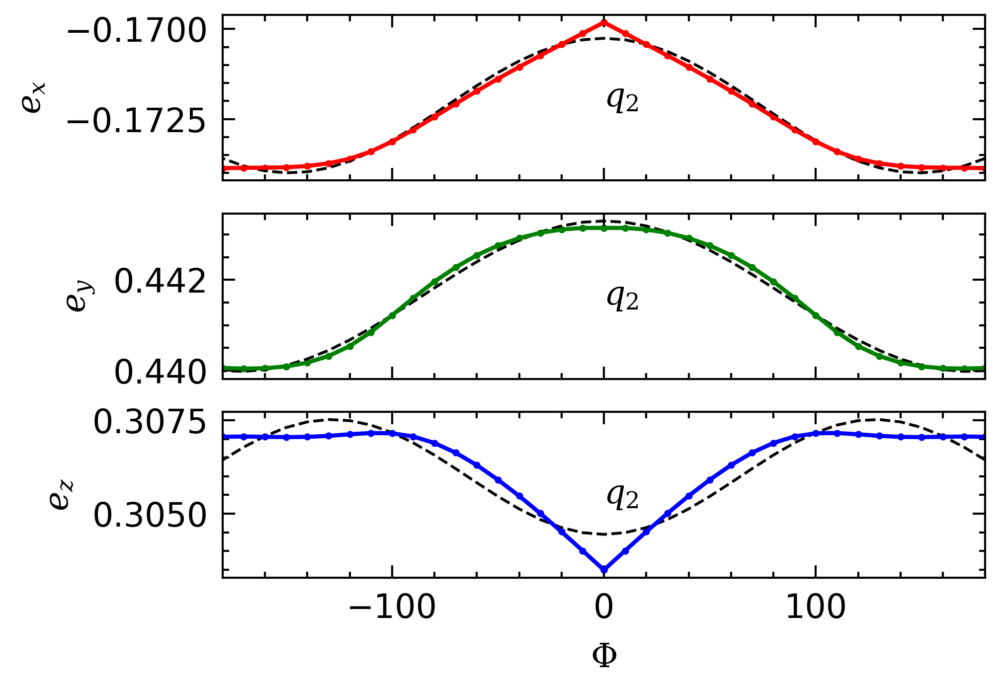

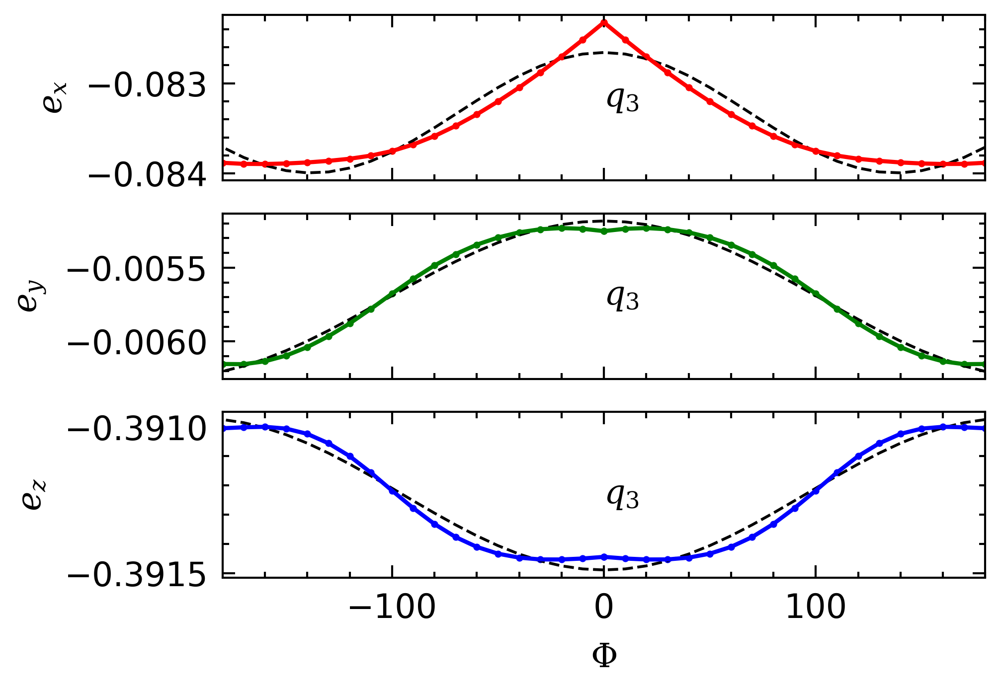

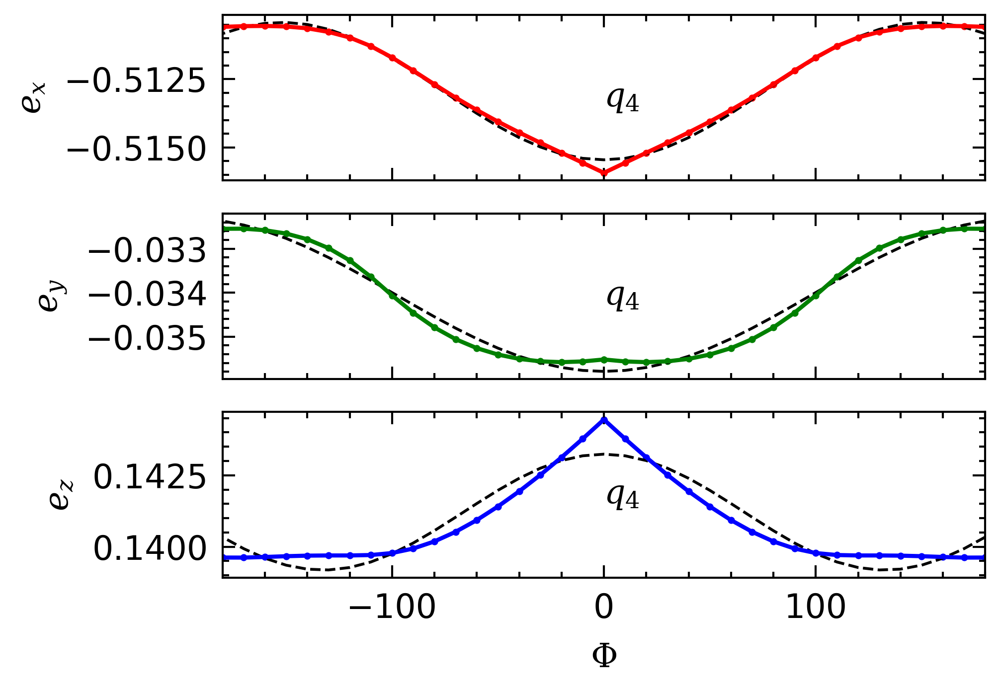

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


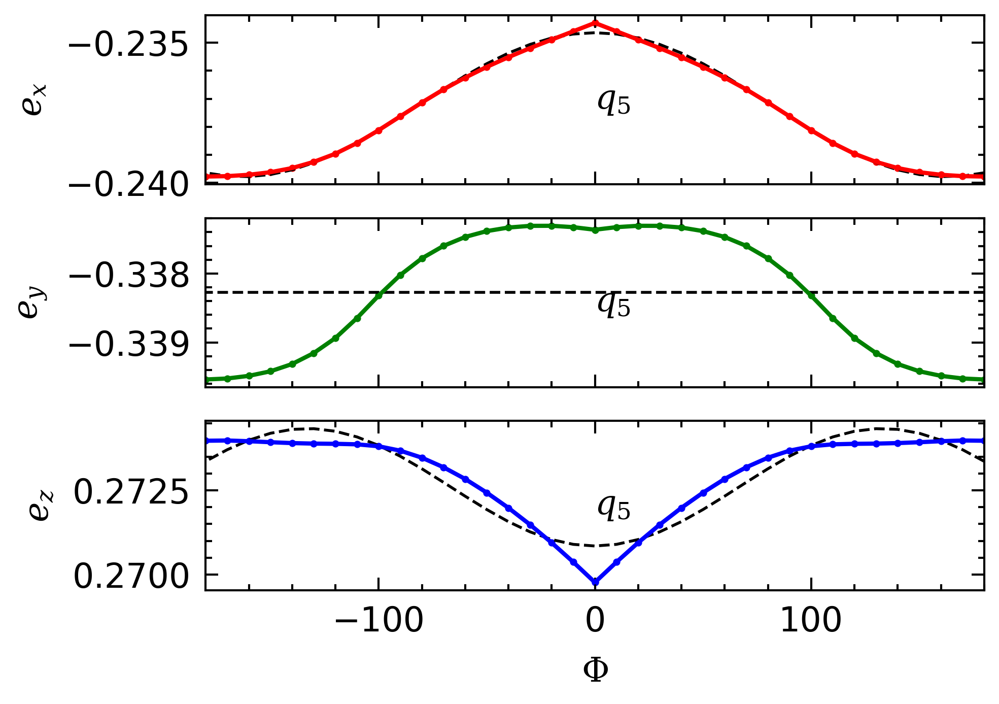

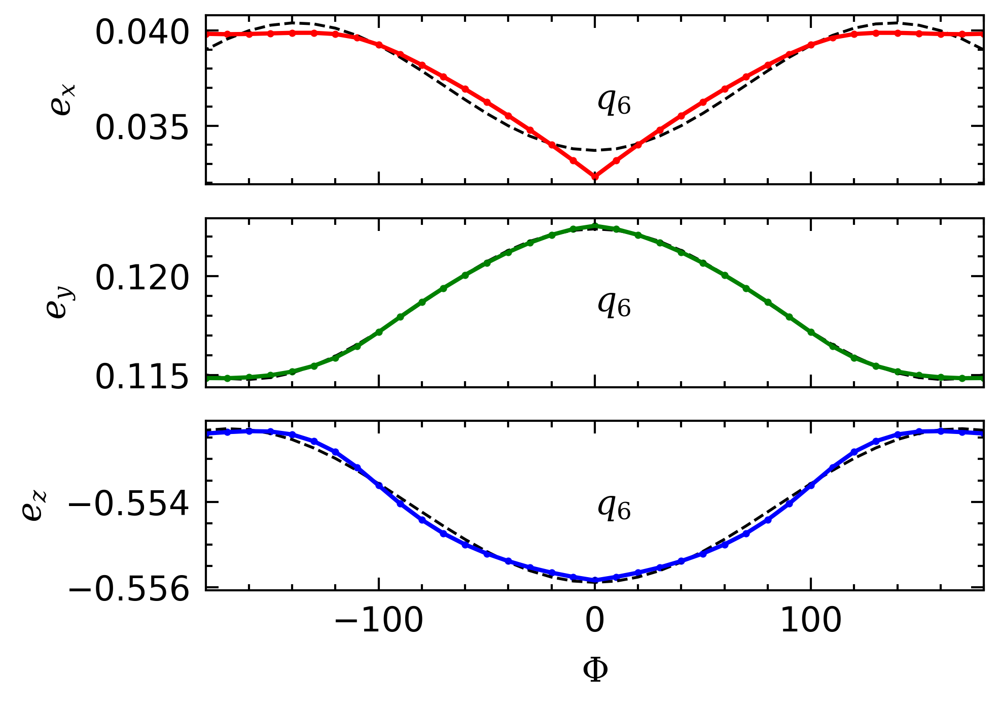

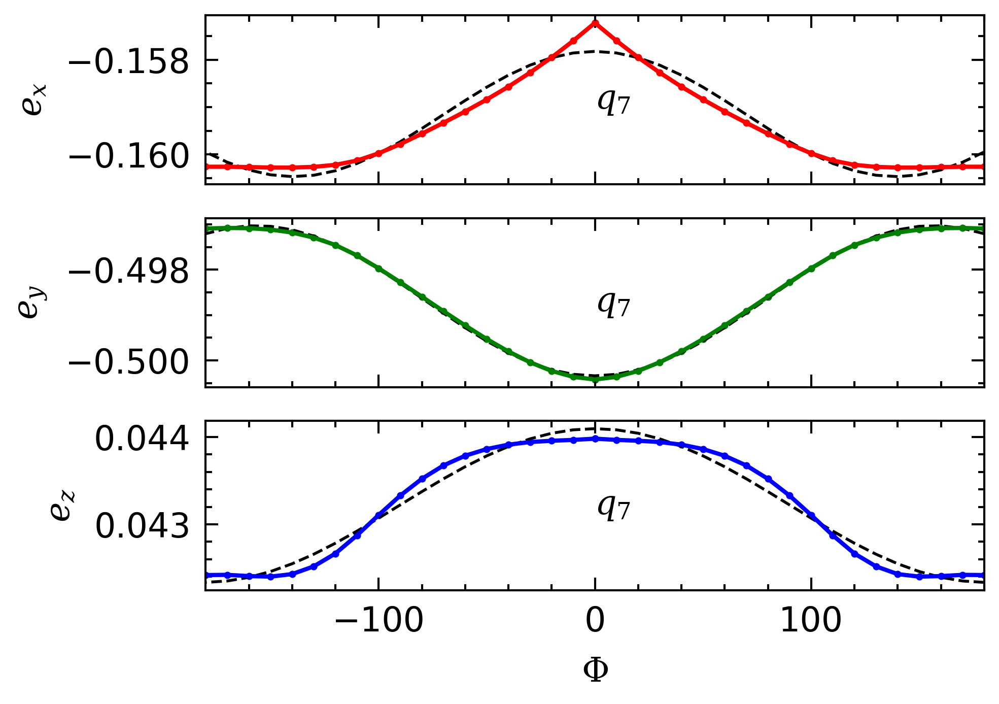

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


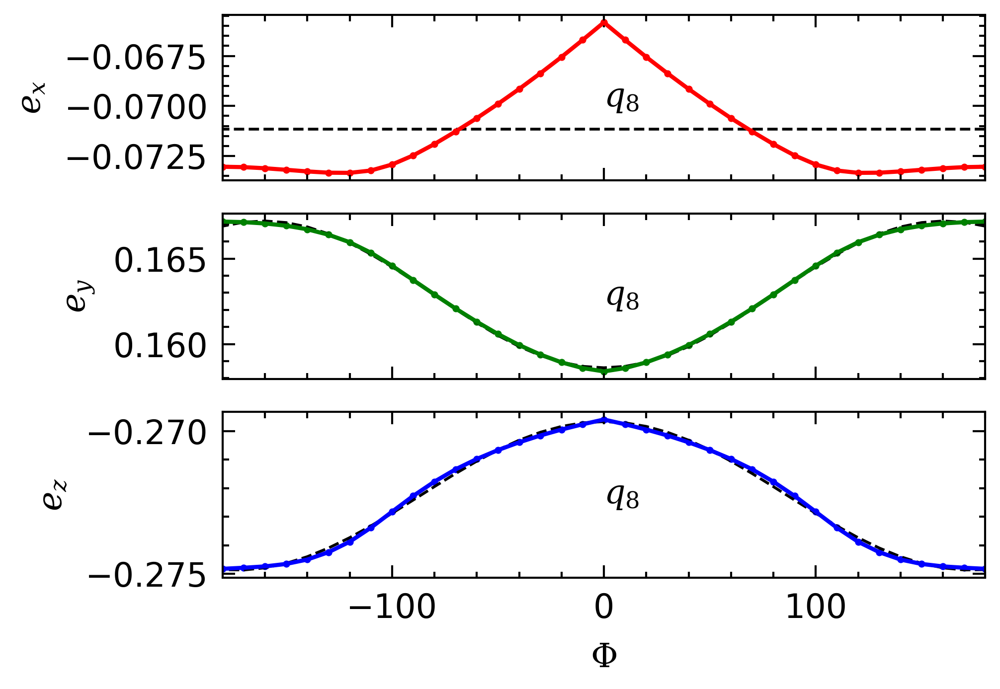

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


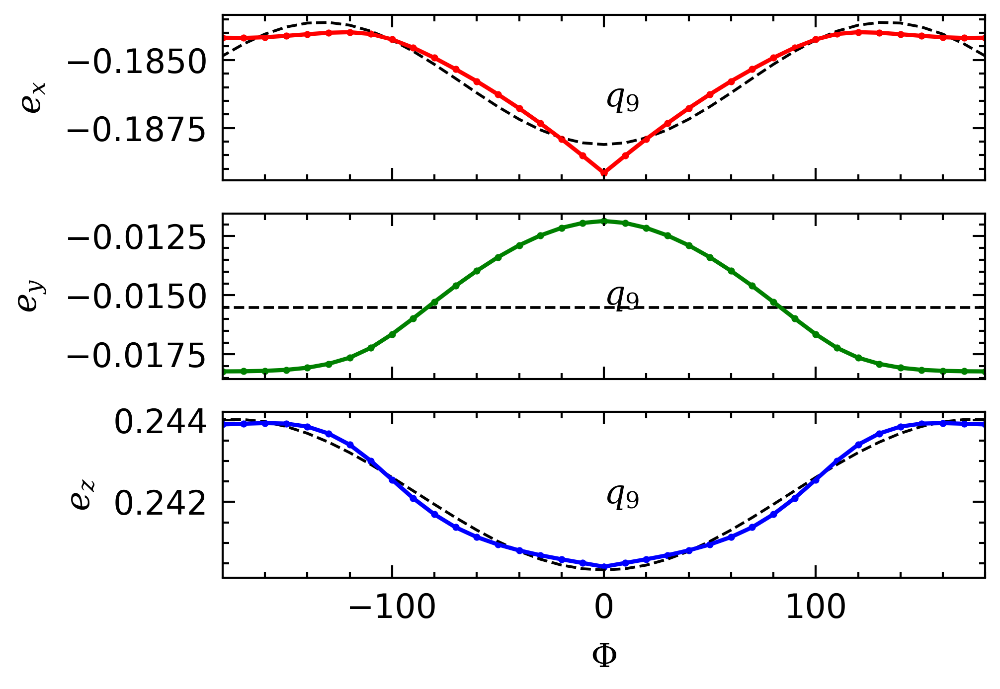

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


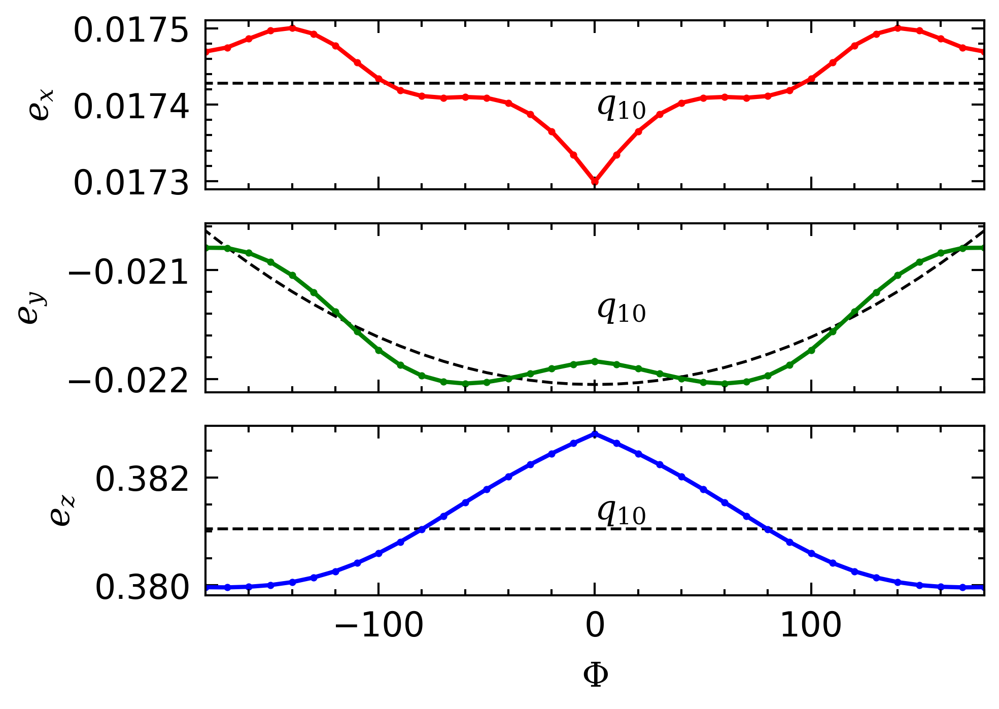

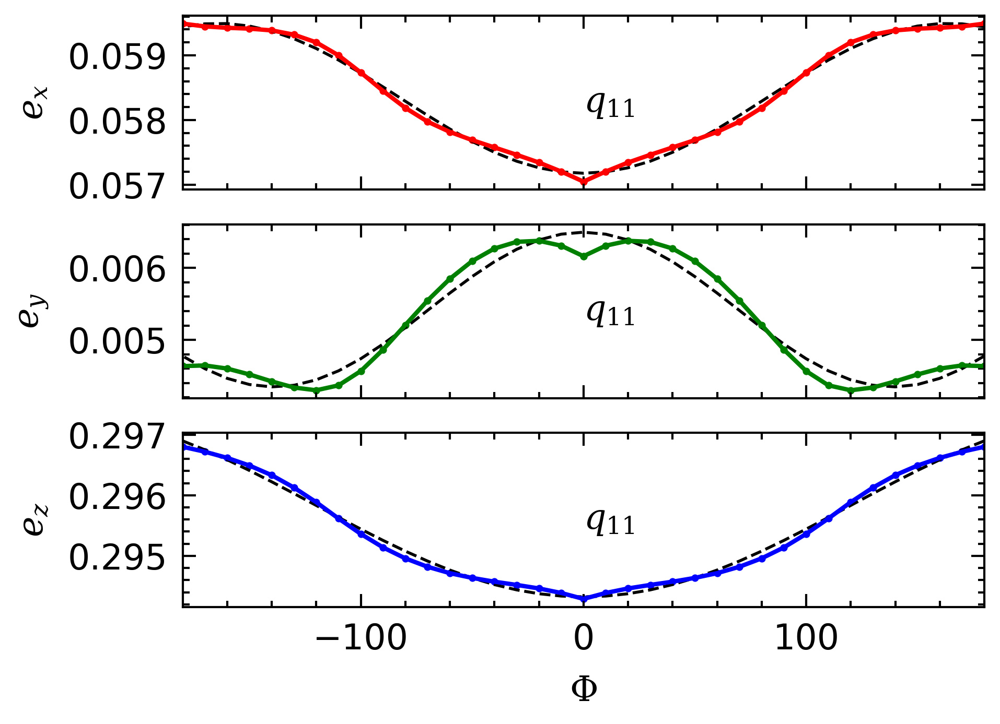

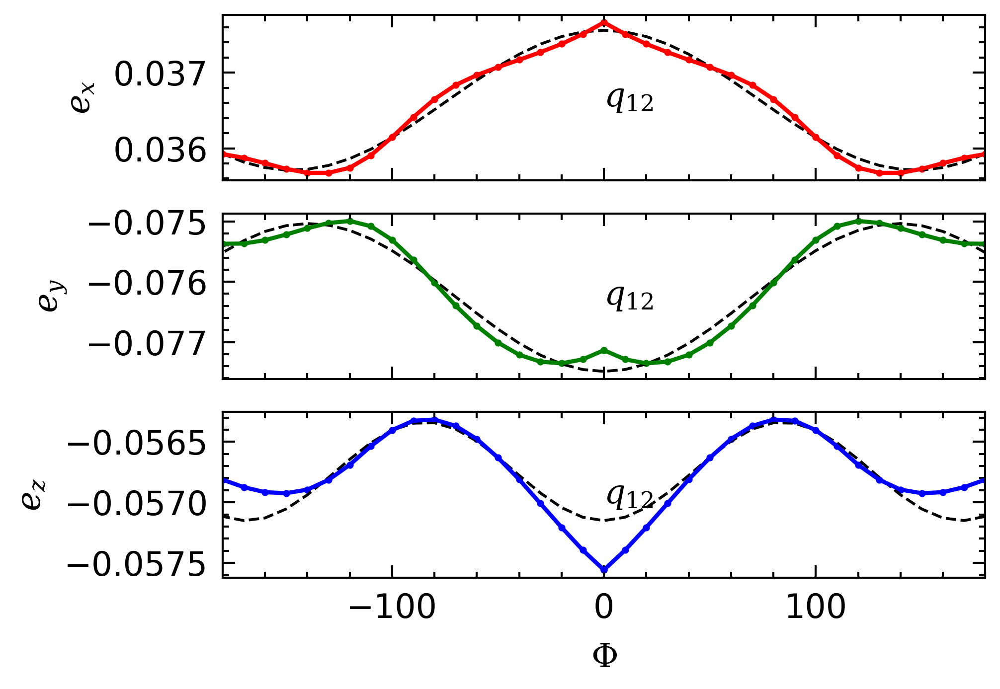

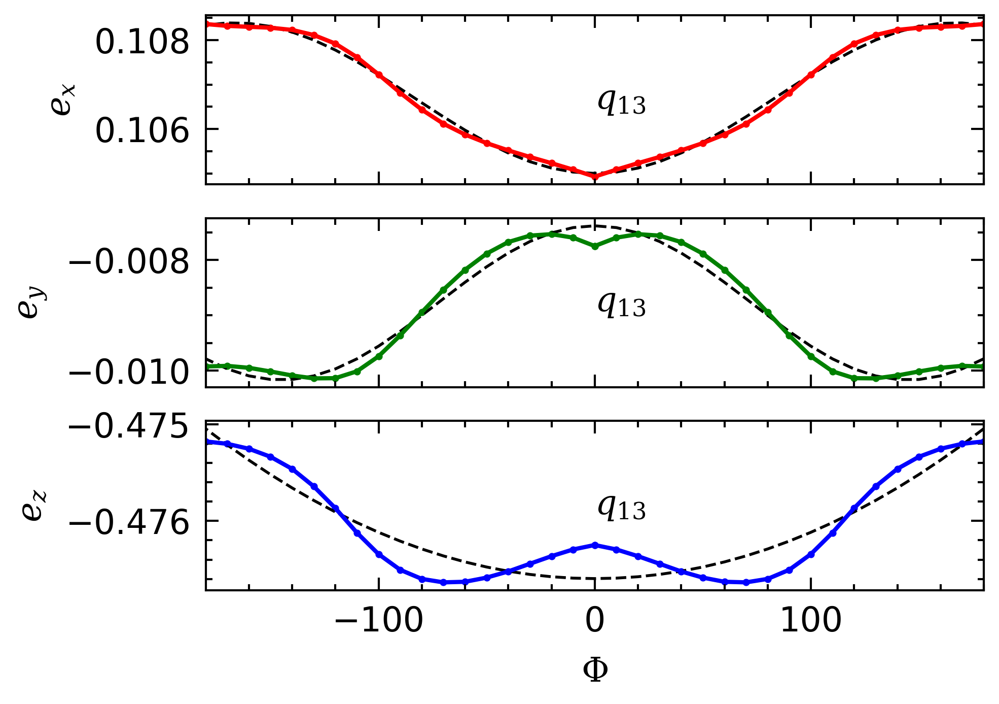

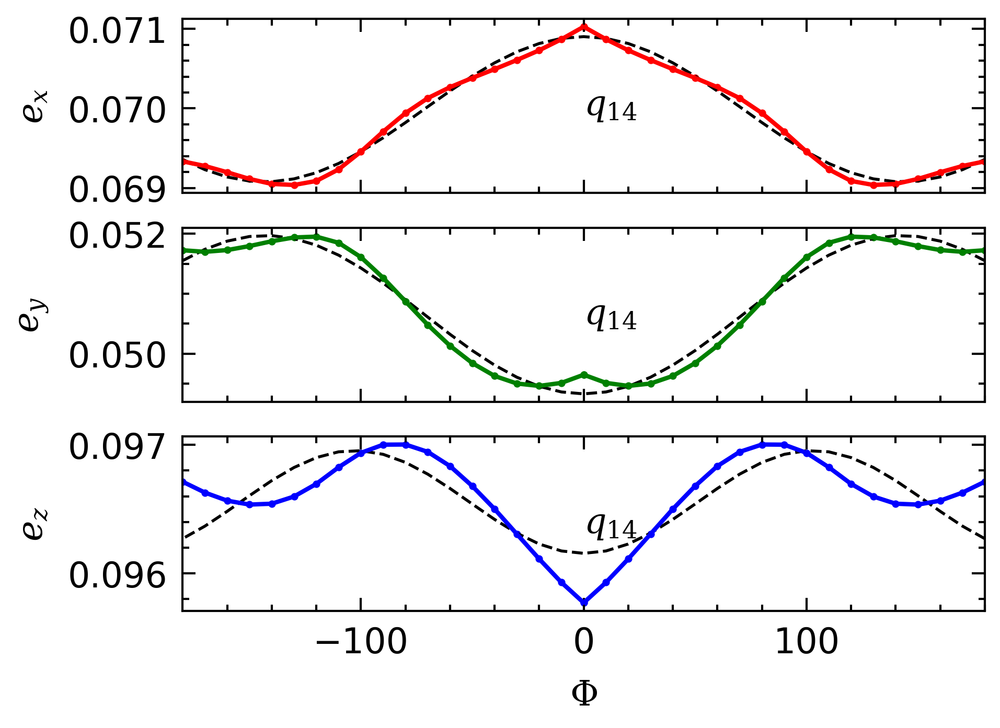

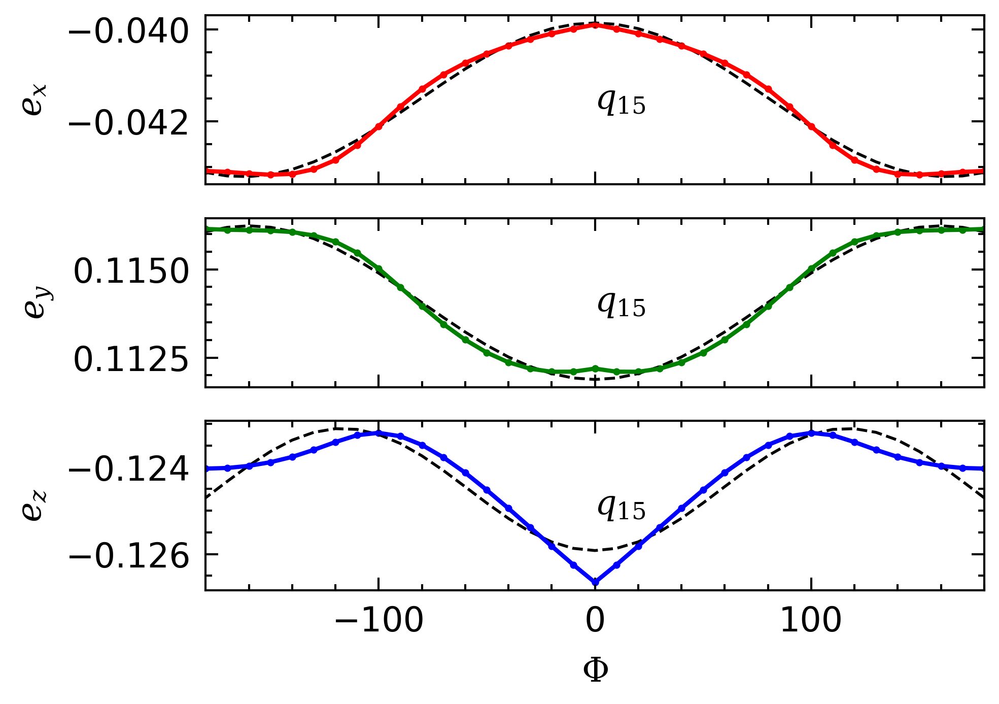

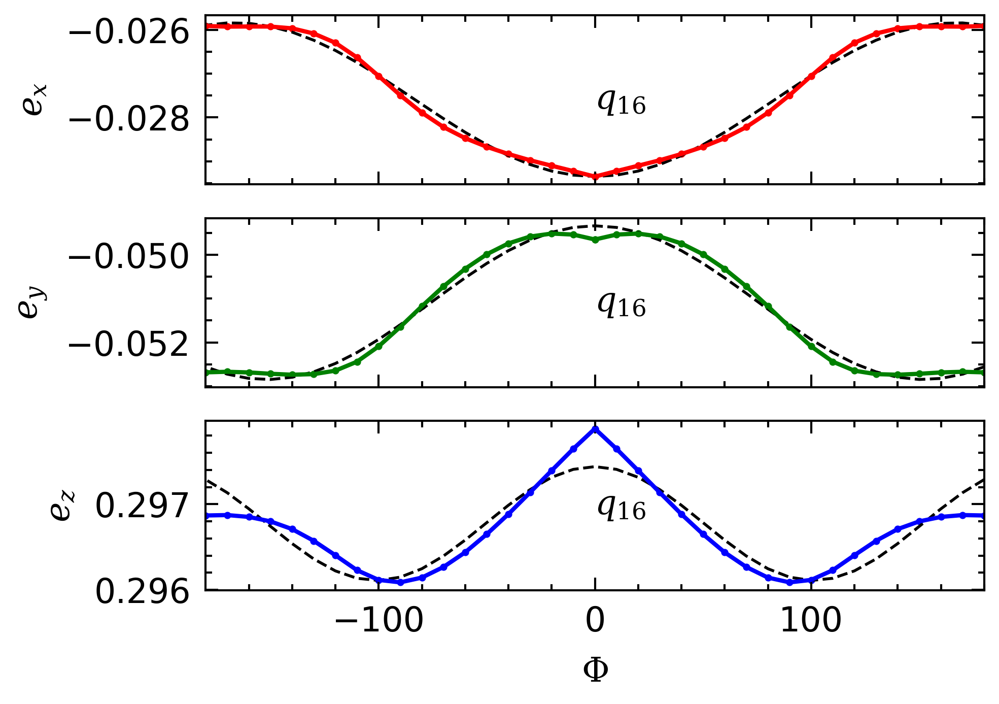

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


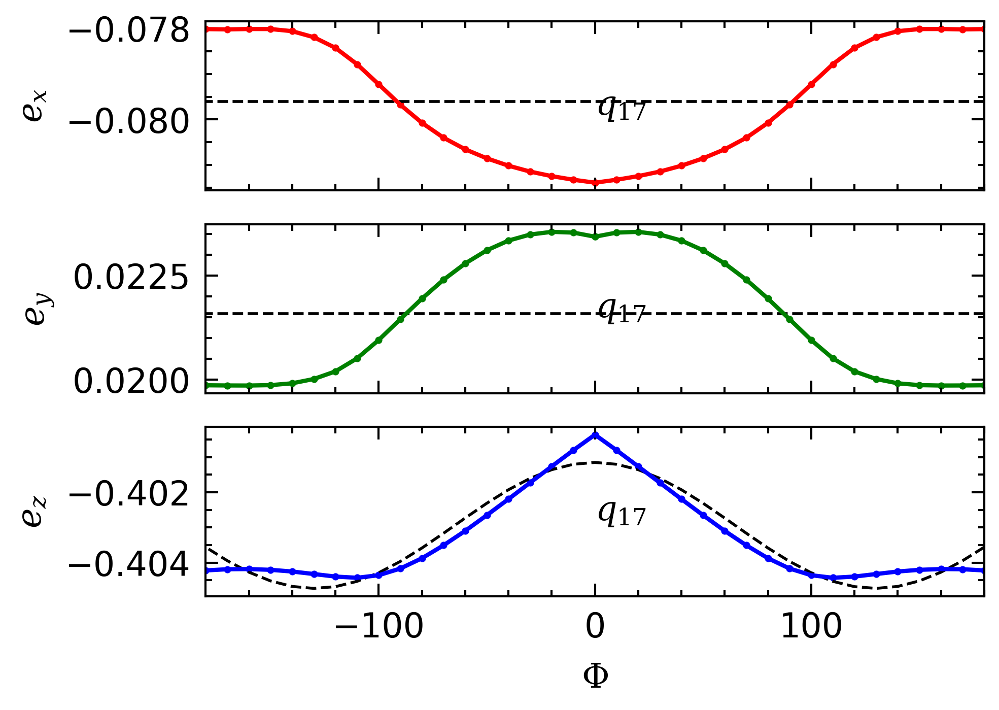

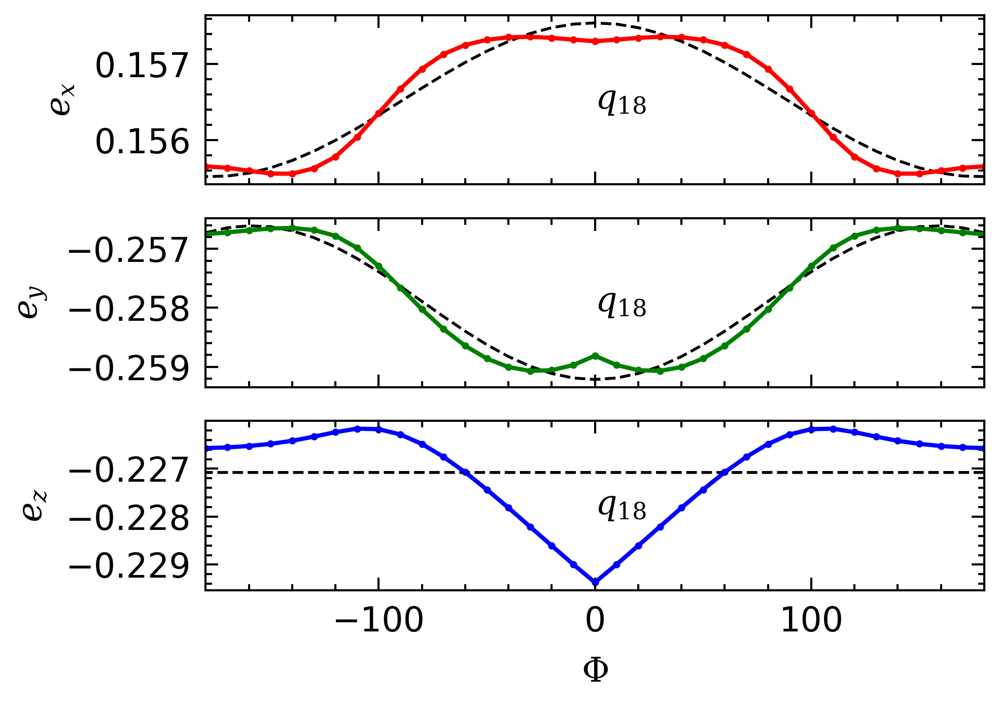

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


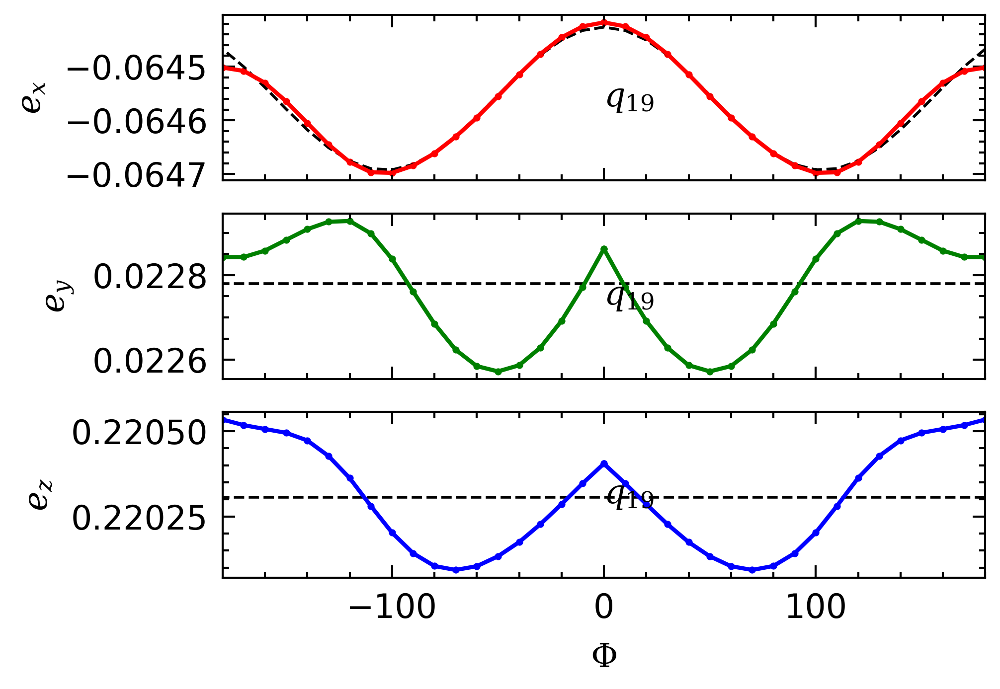

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


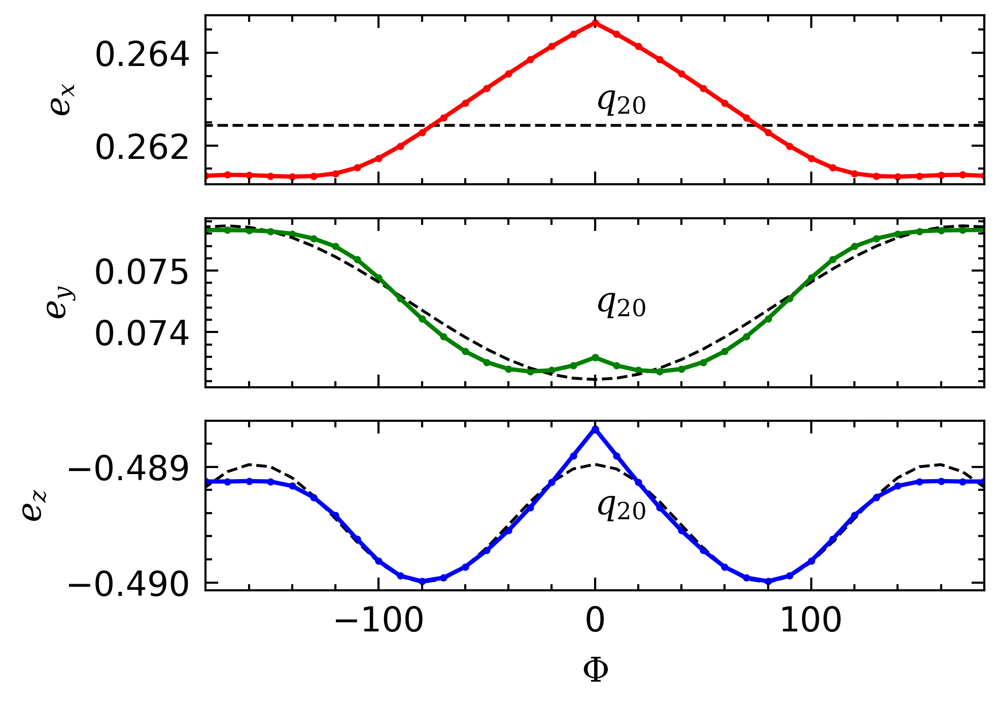

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


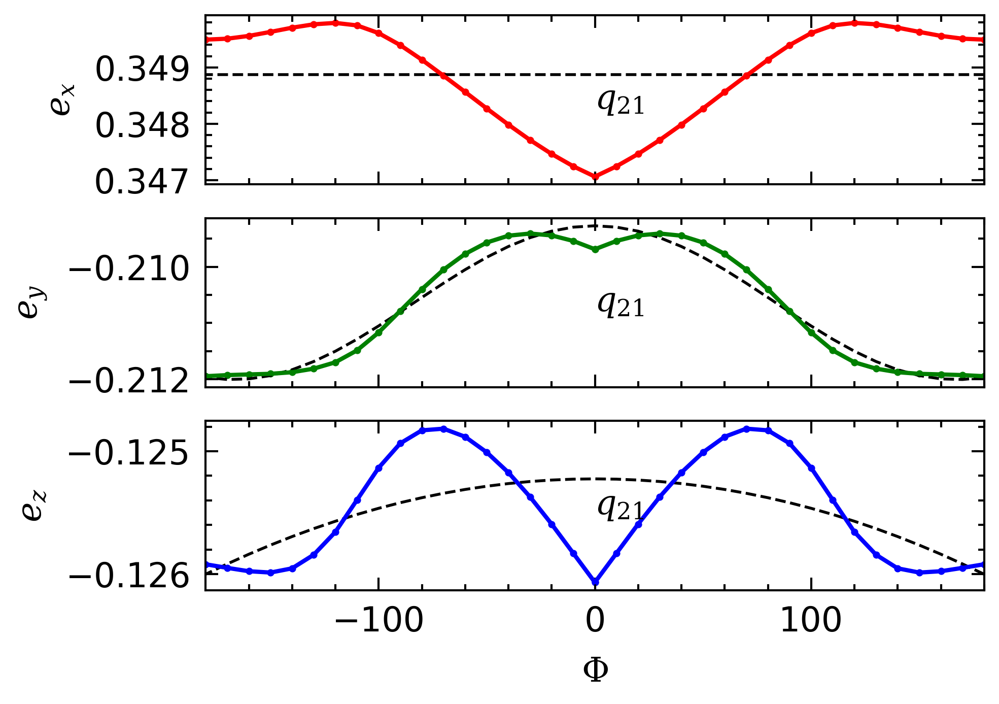

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


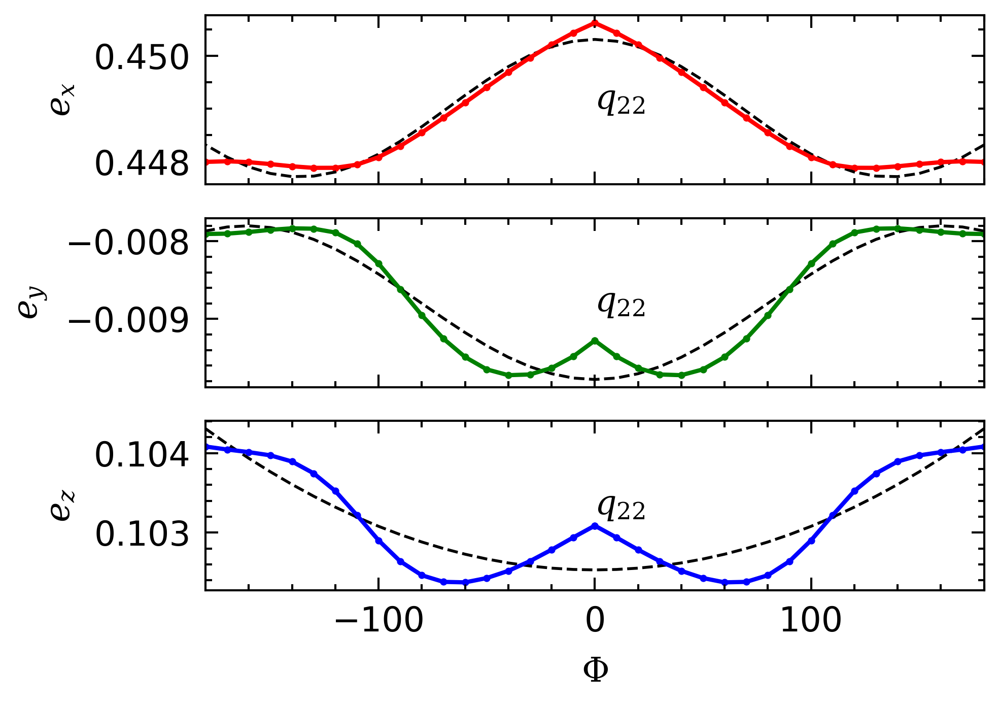

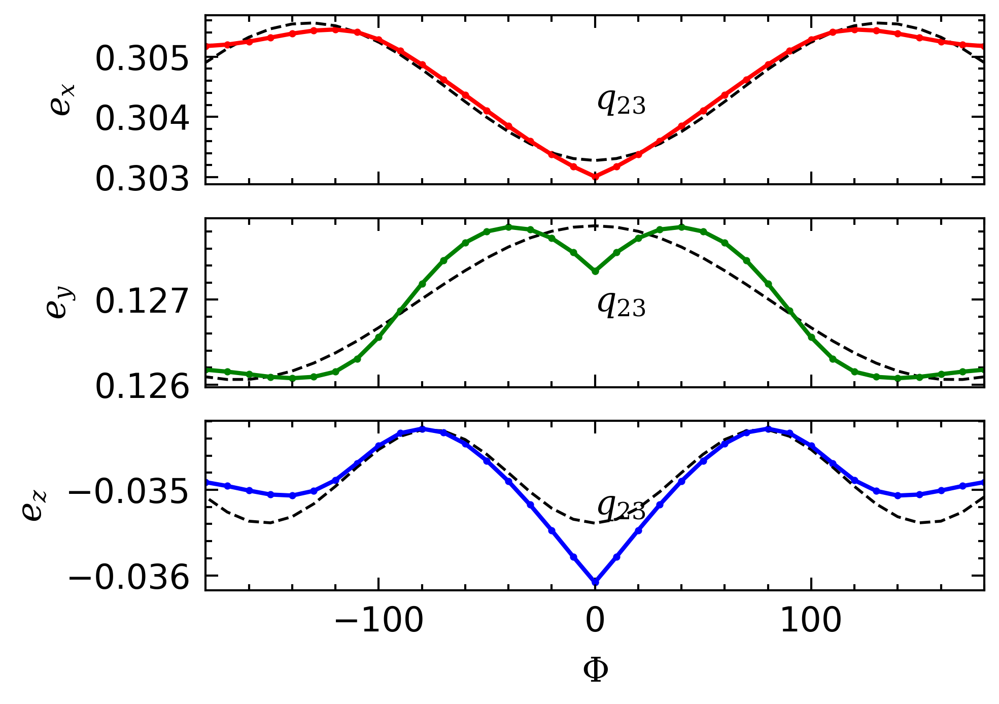

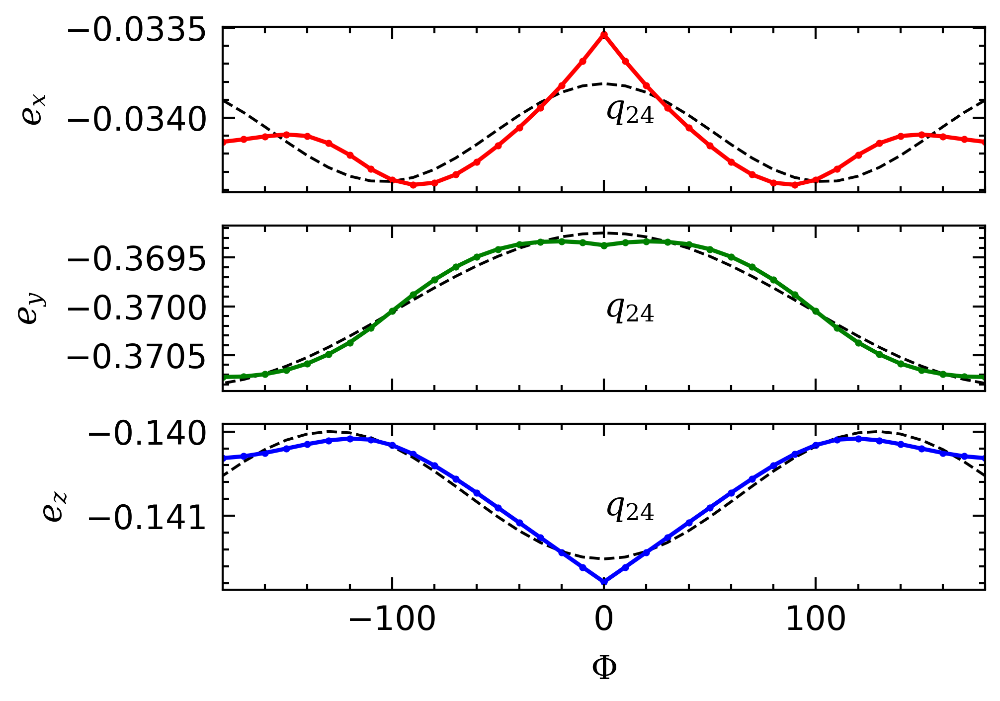

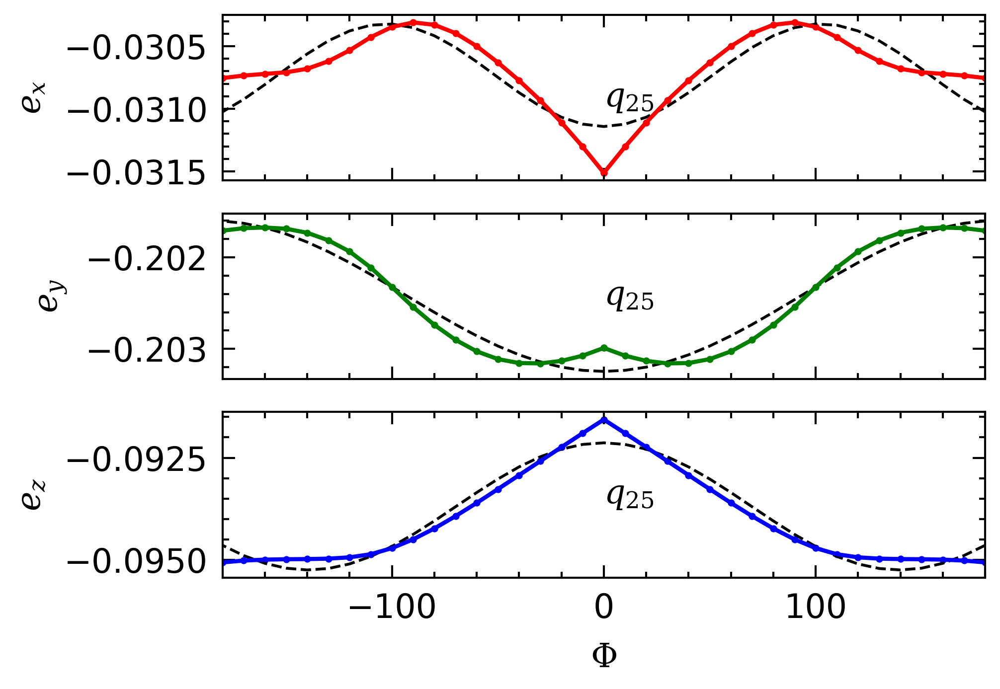

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


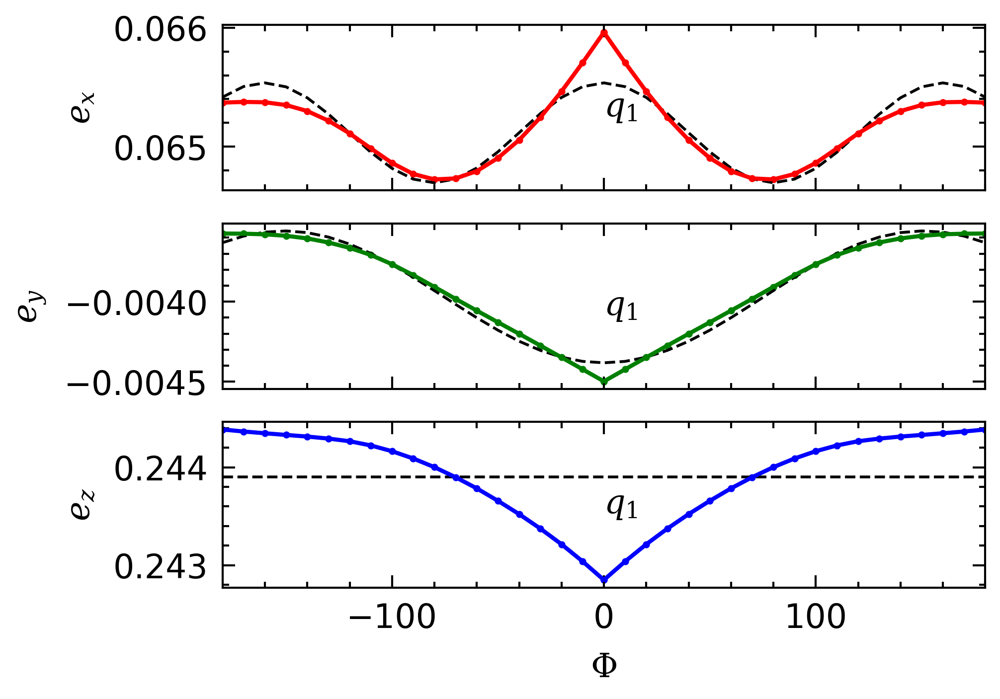

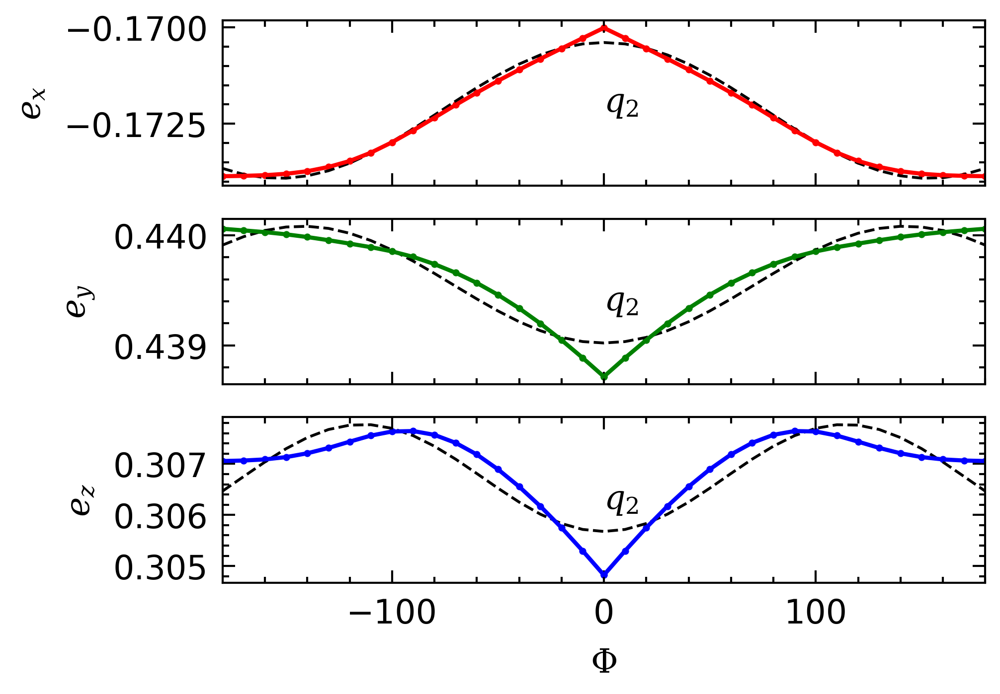

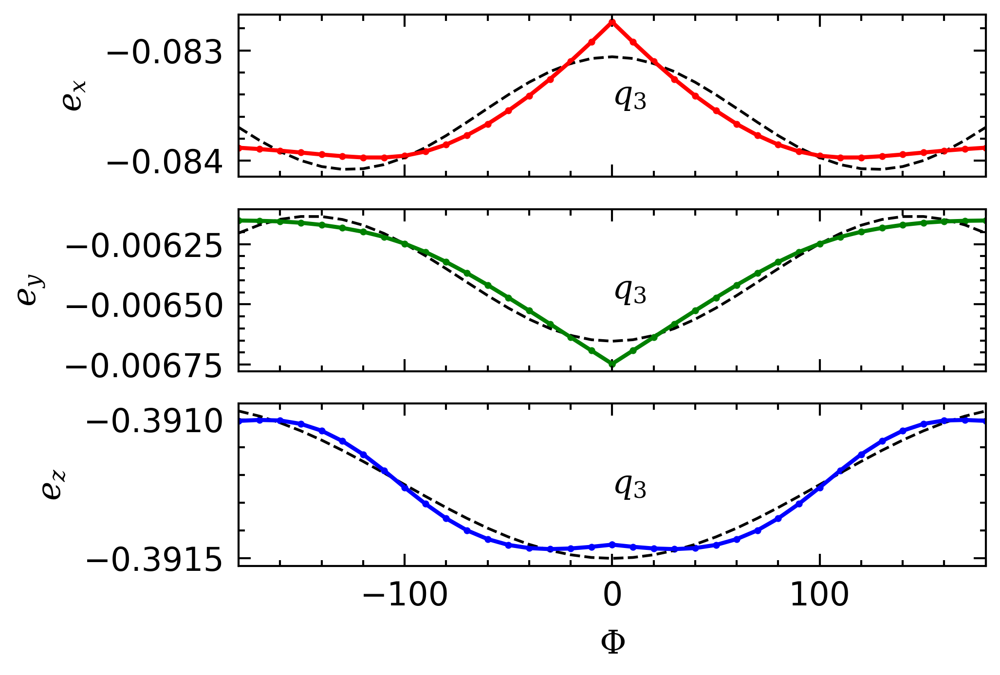

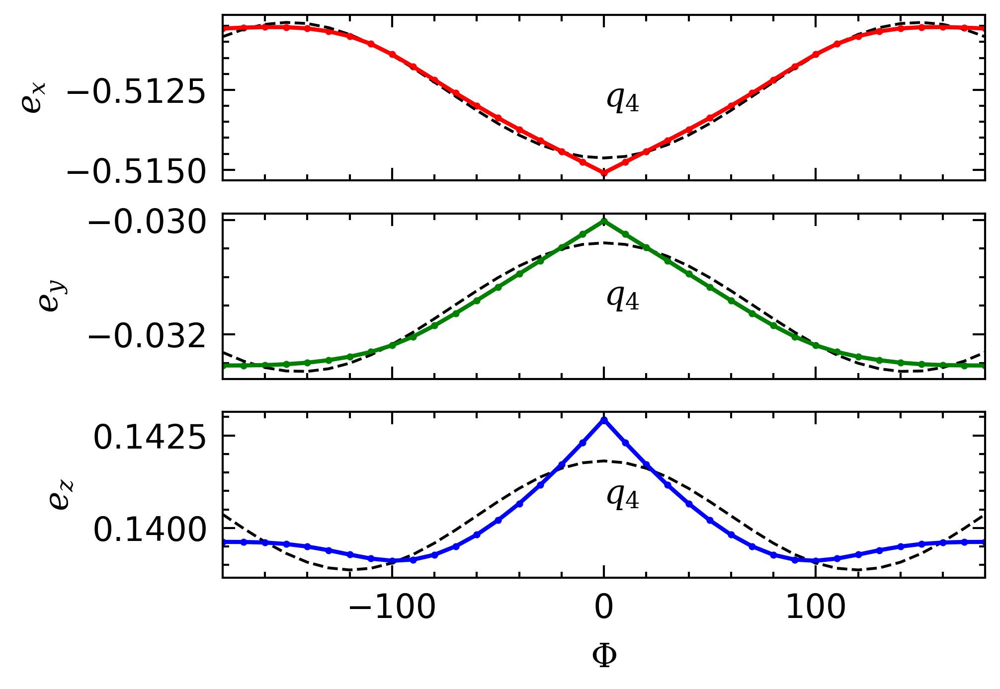

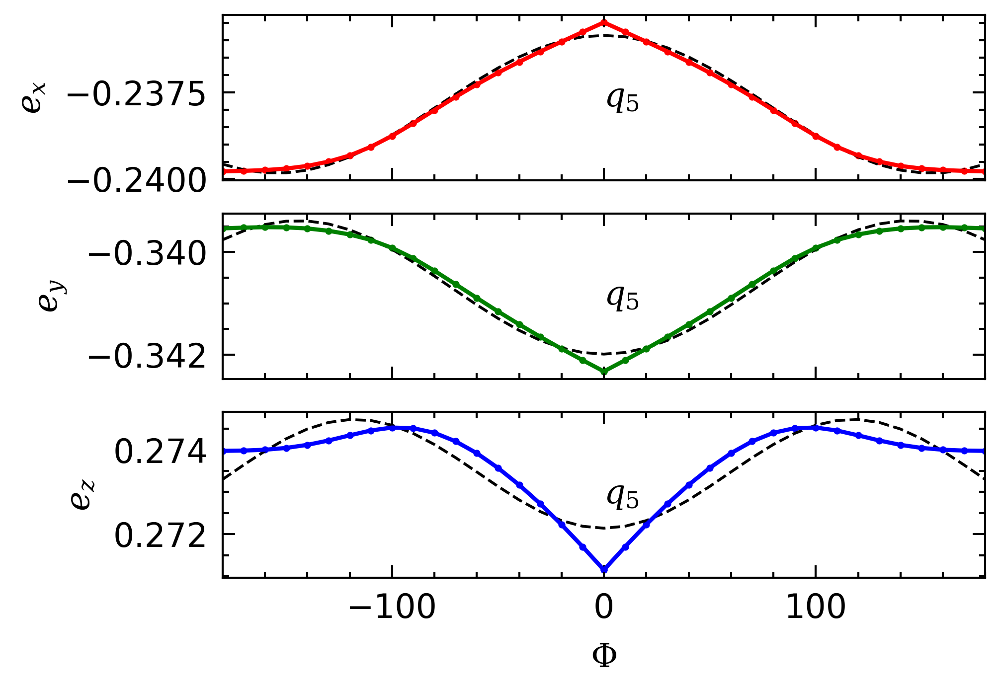

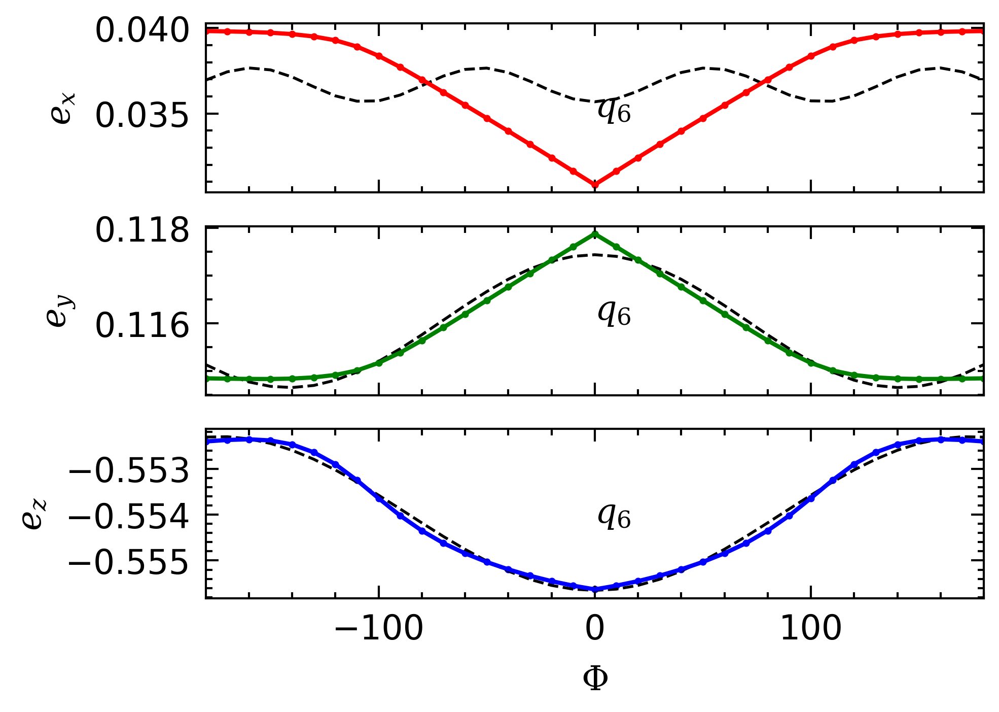

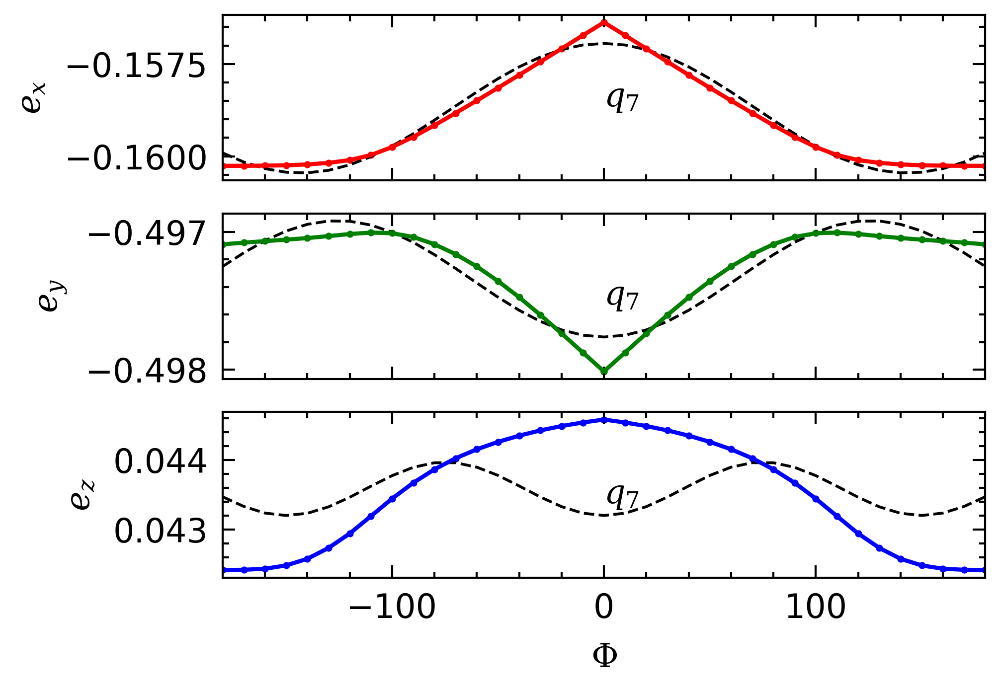

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


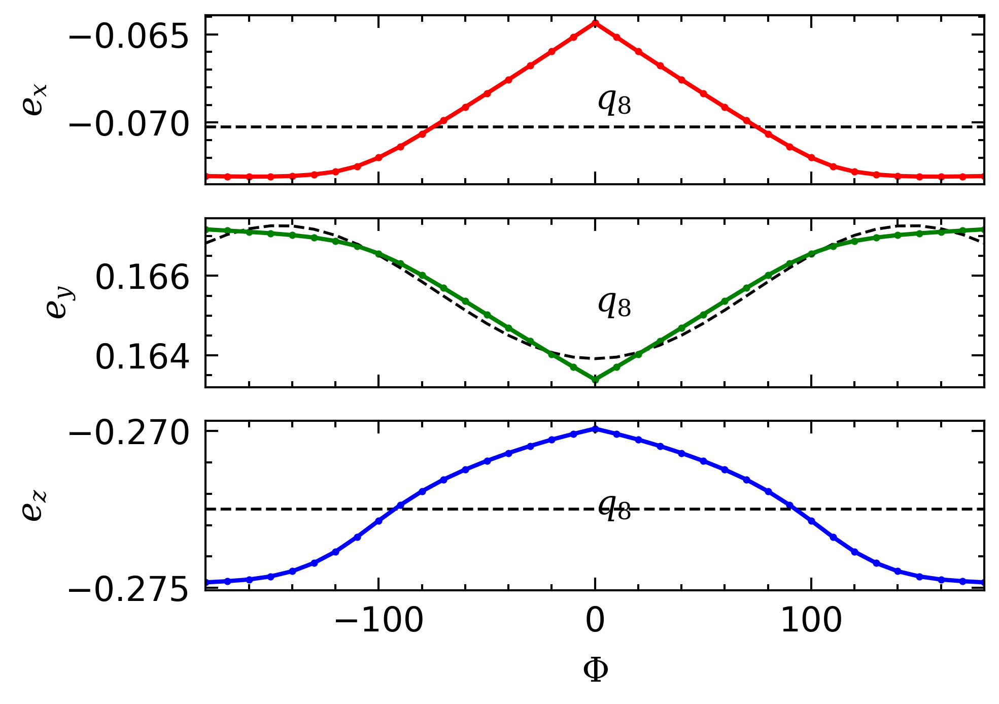

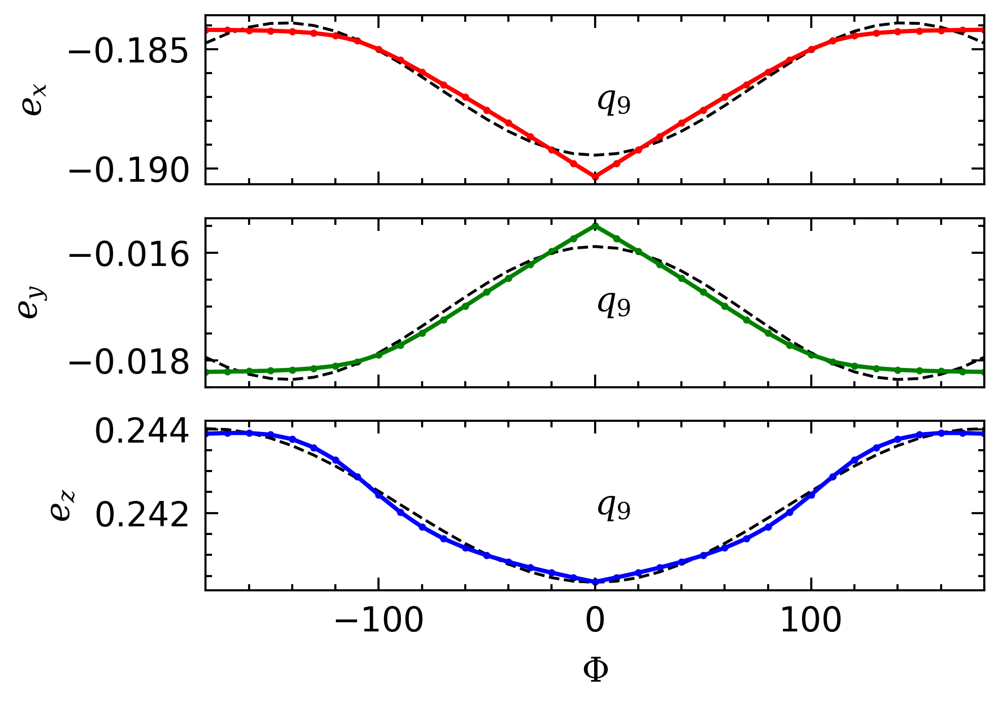

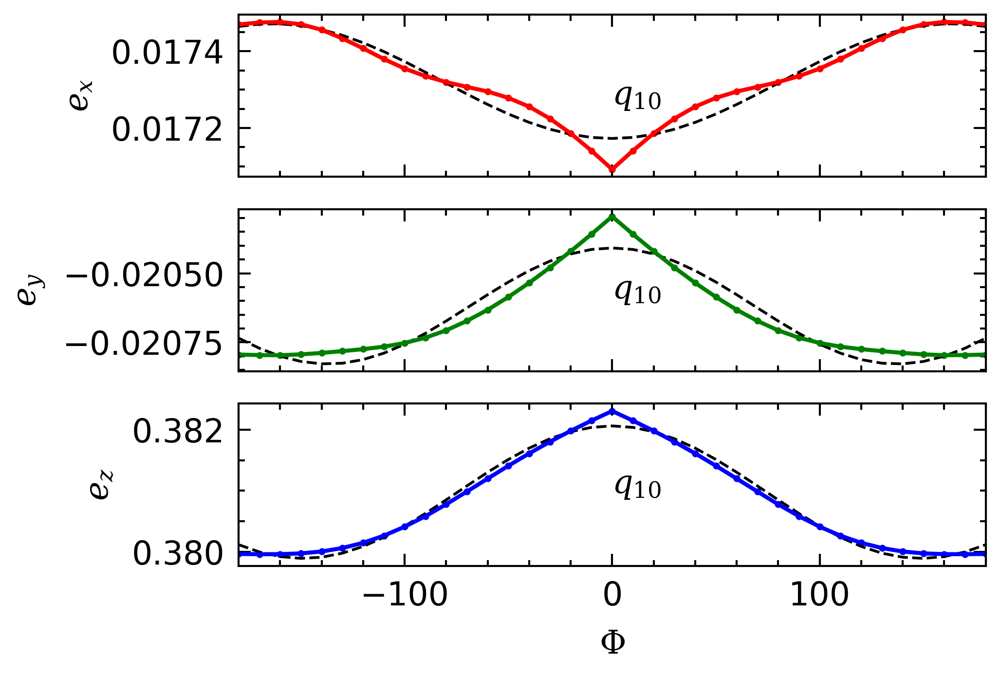

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


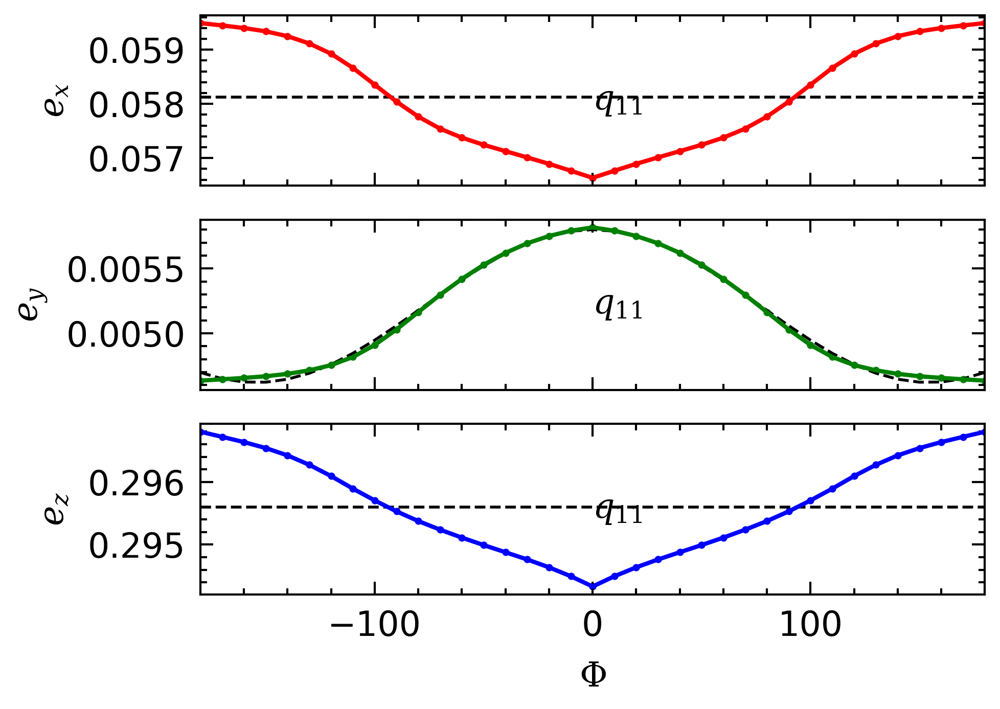

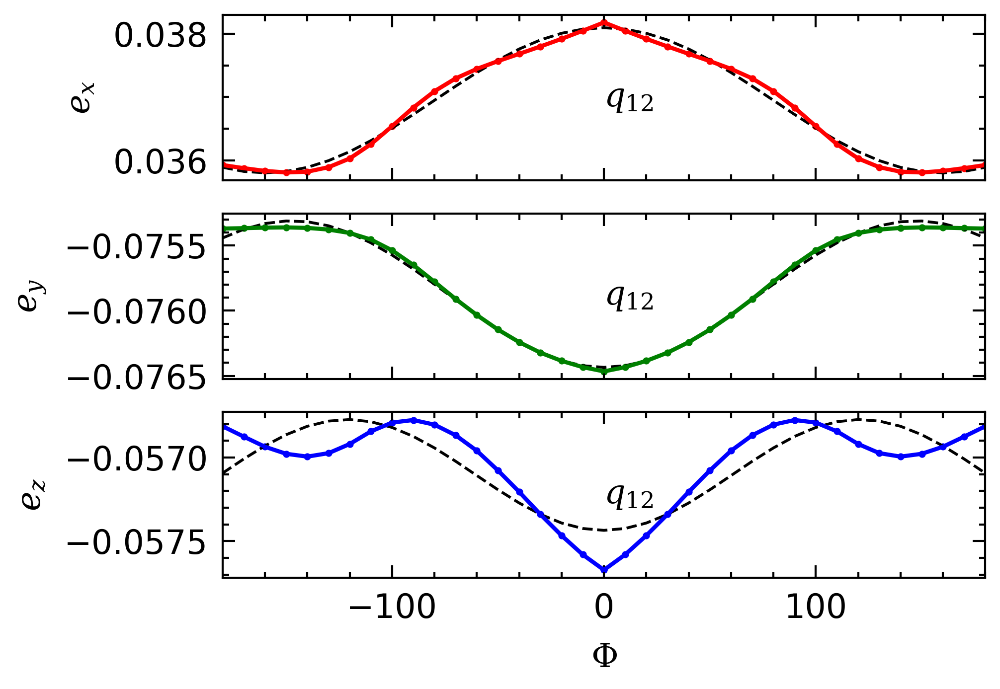

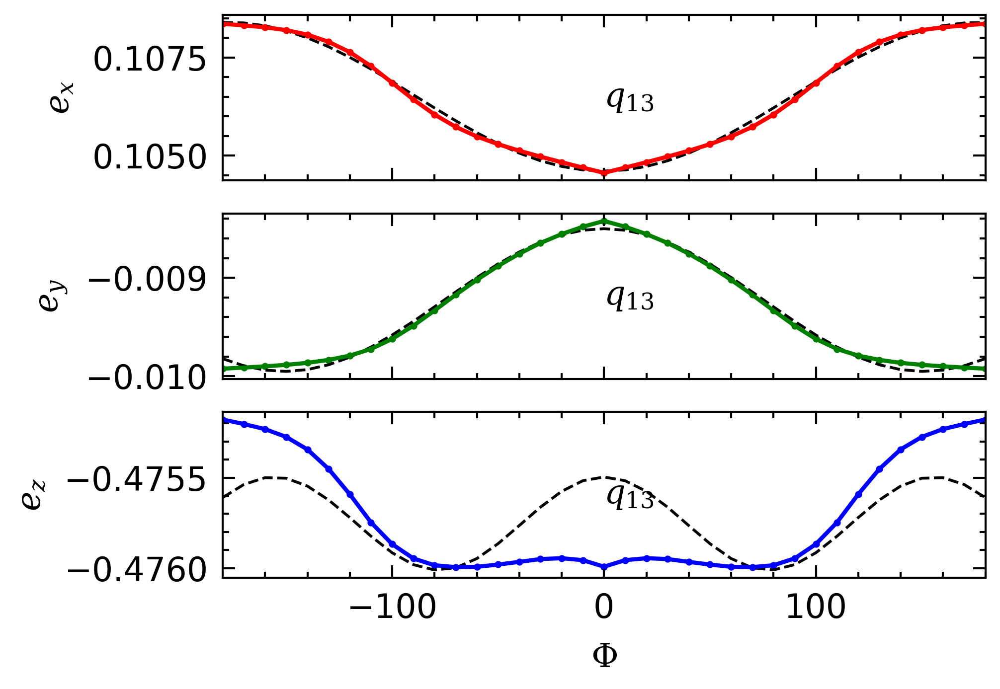

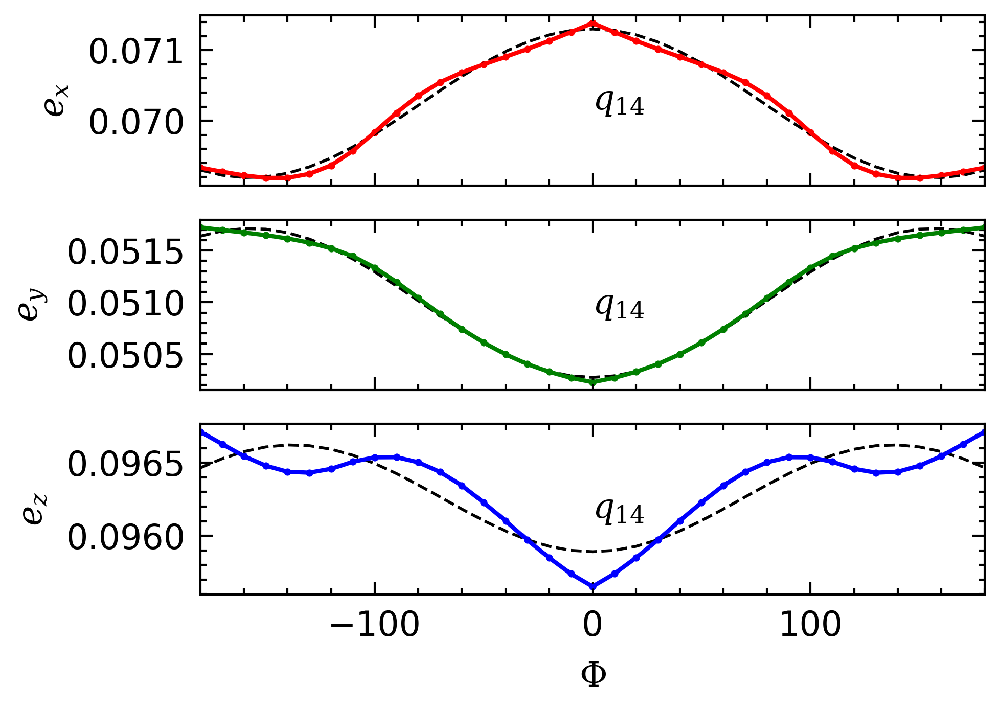

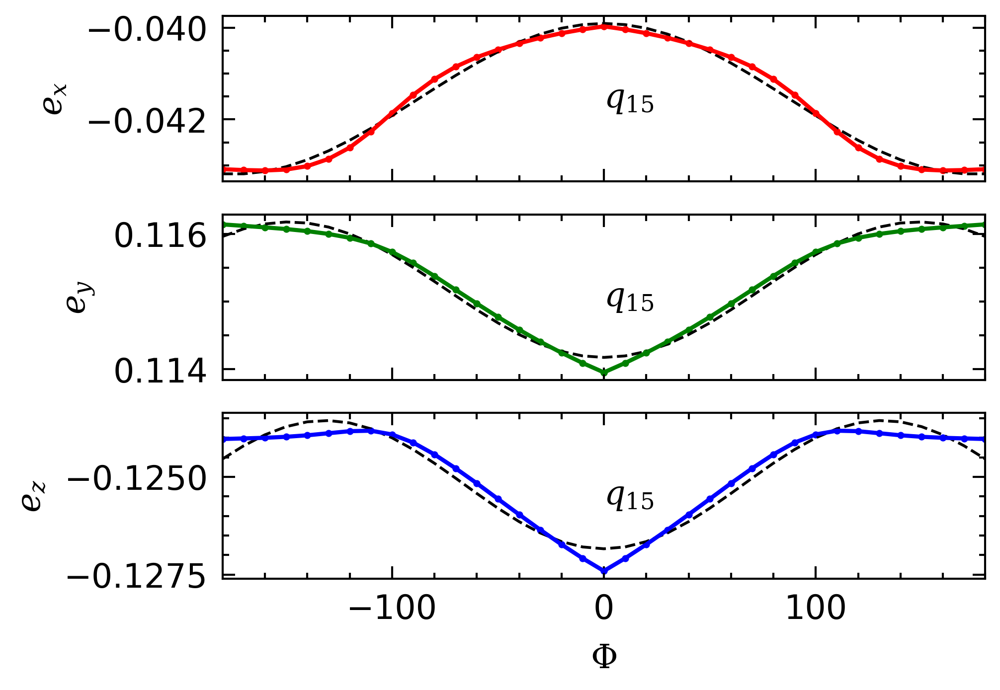

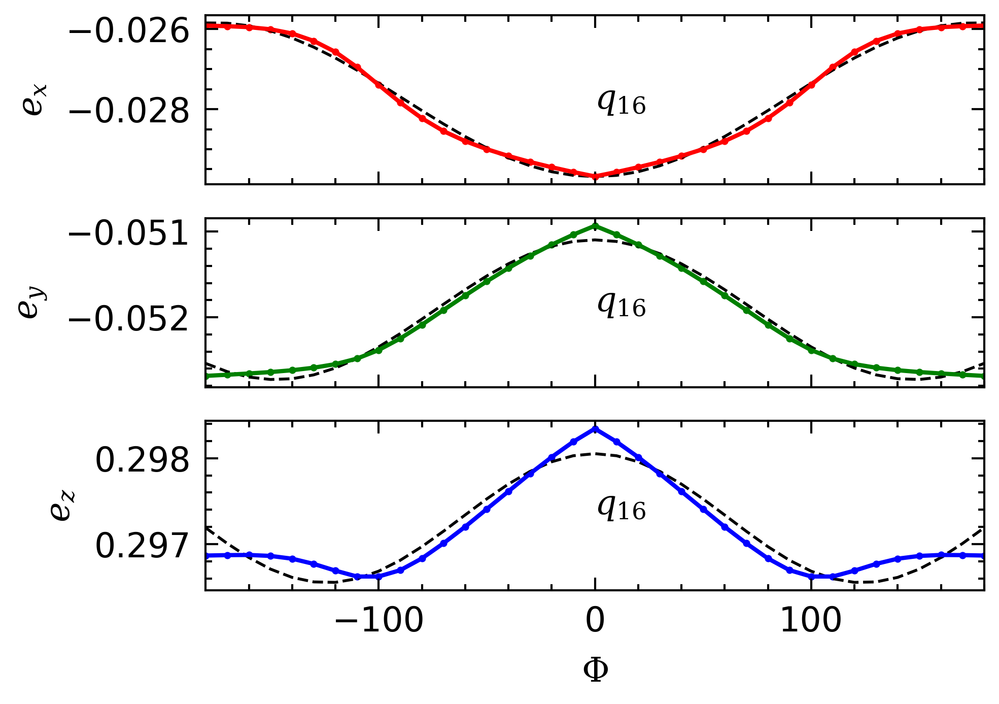

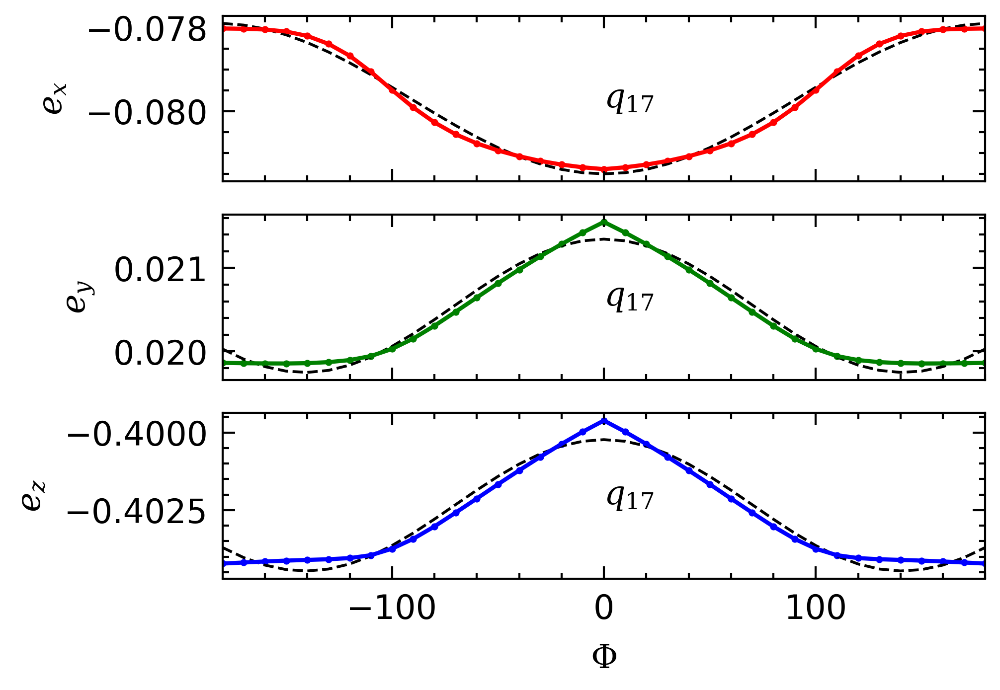

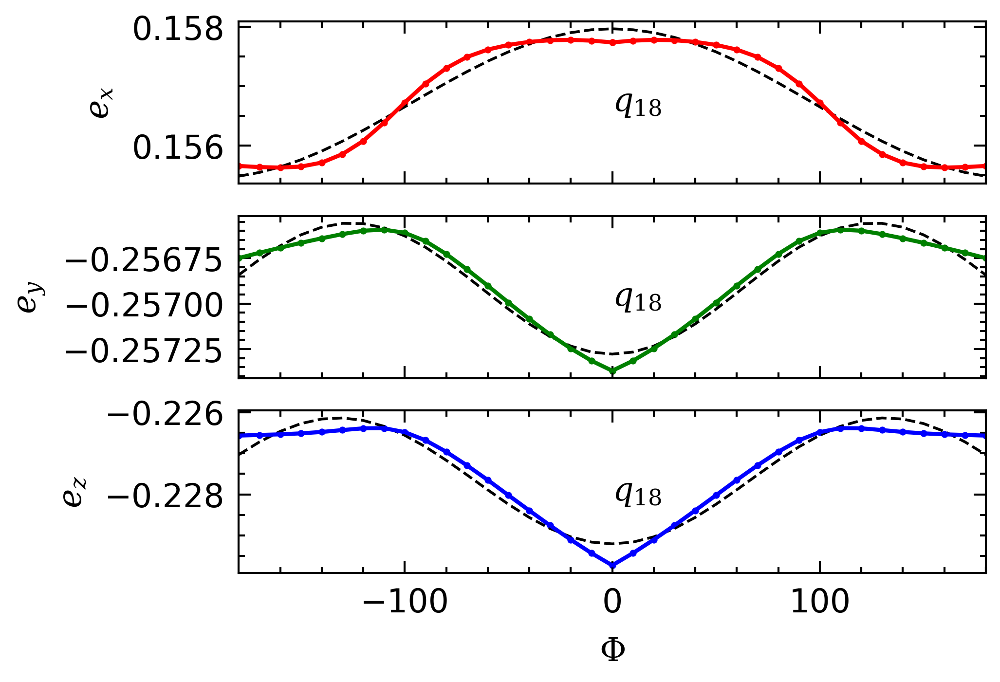

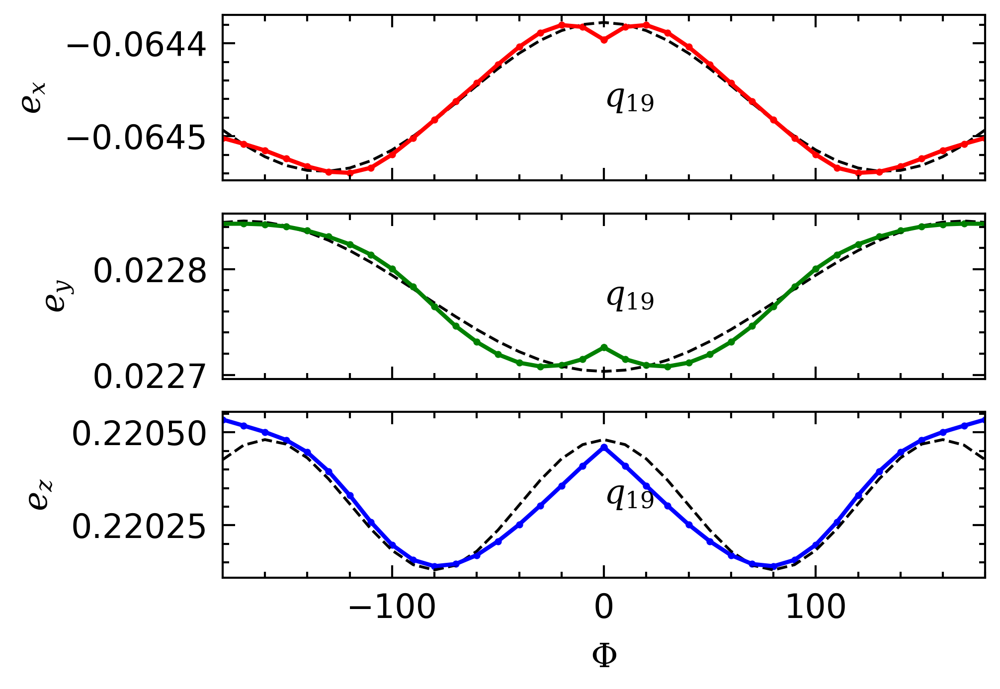

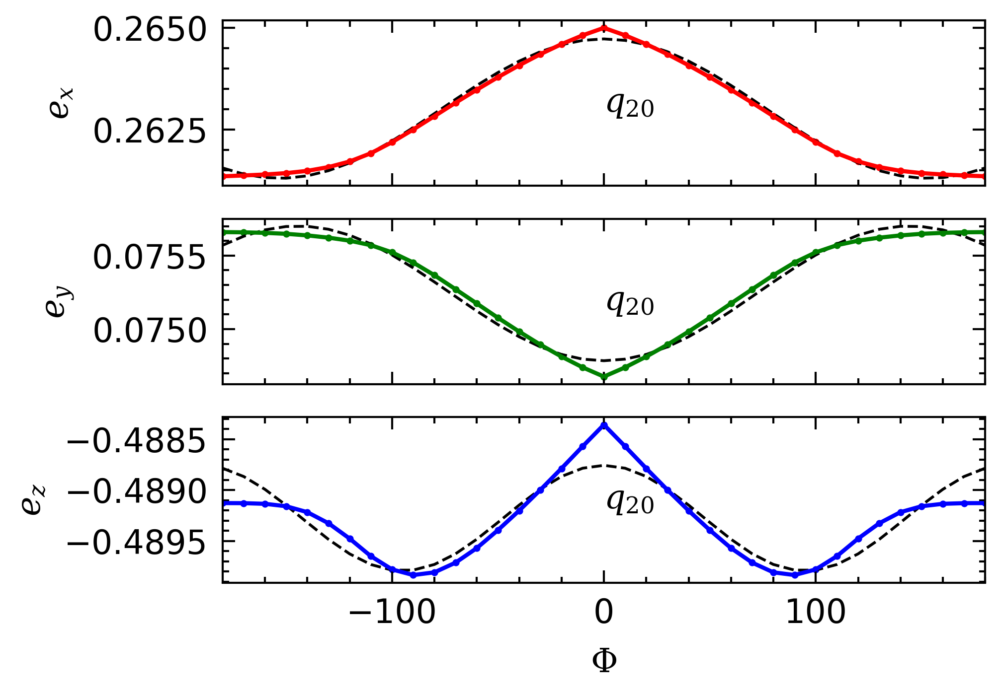

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


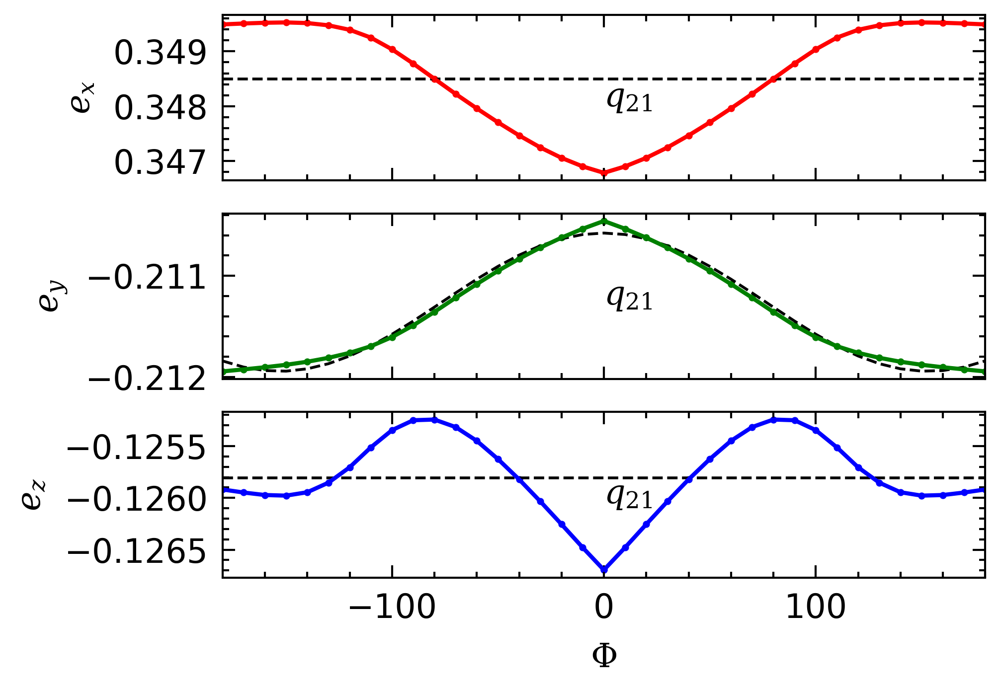

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


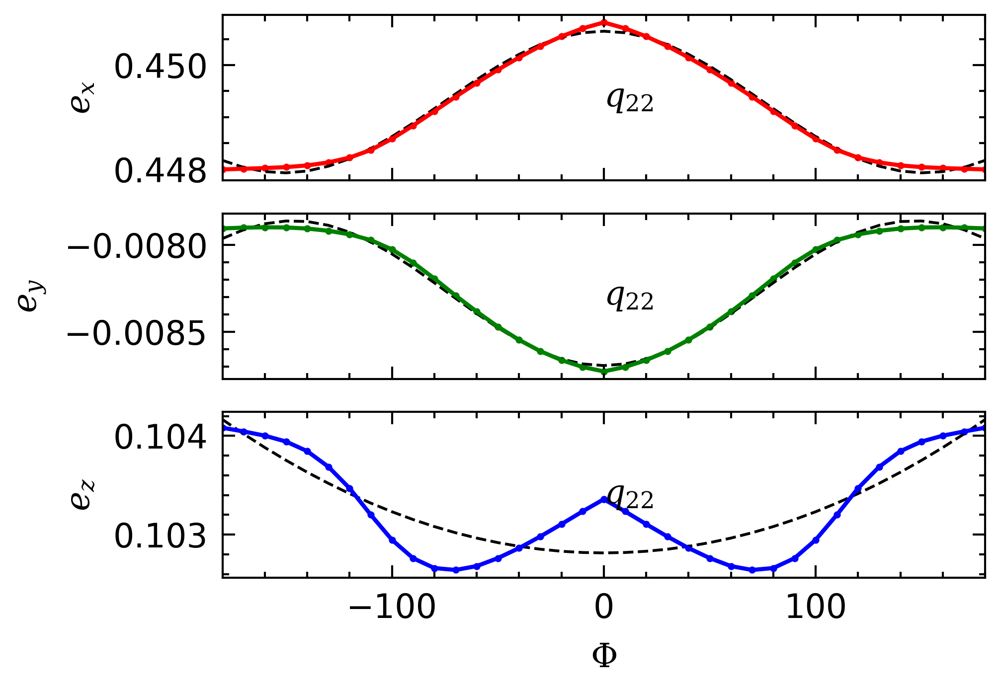

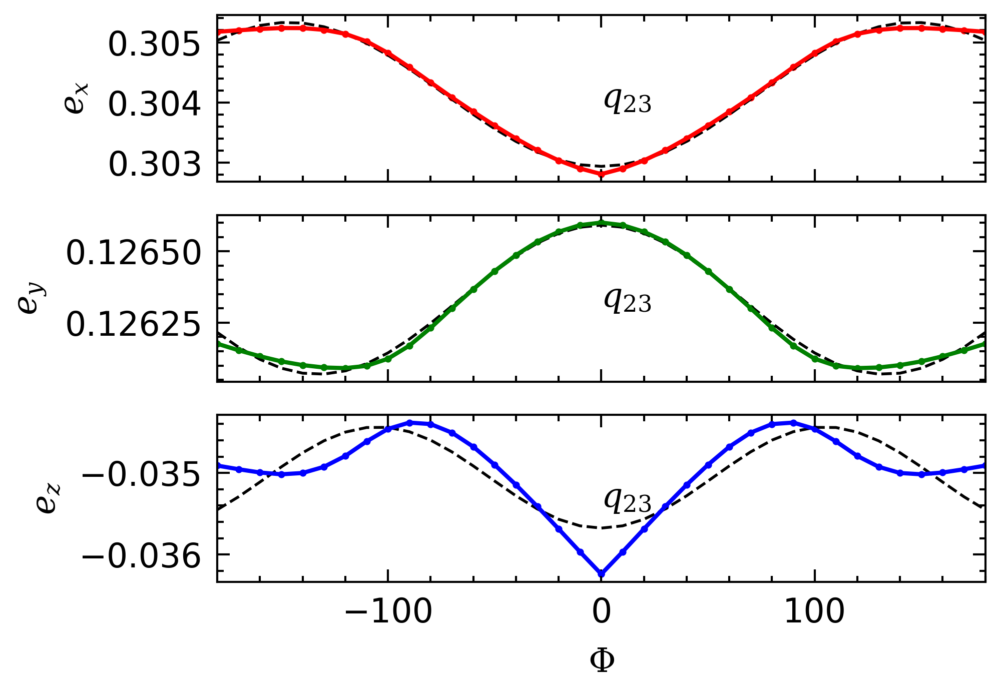

/home/unibas/boittier/miniconda3/lib/python3.9/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


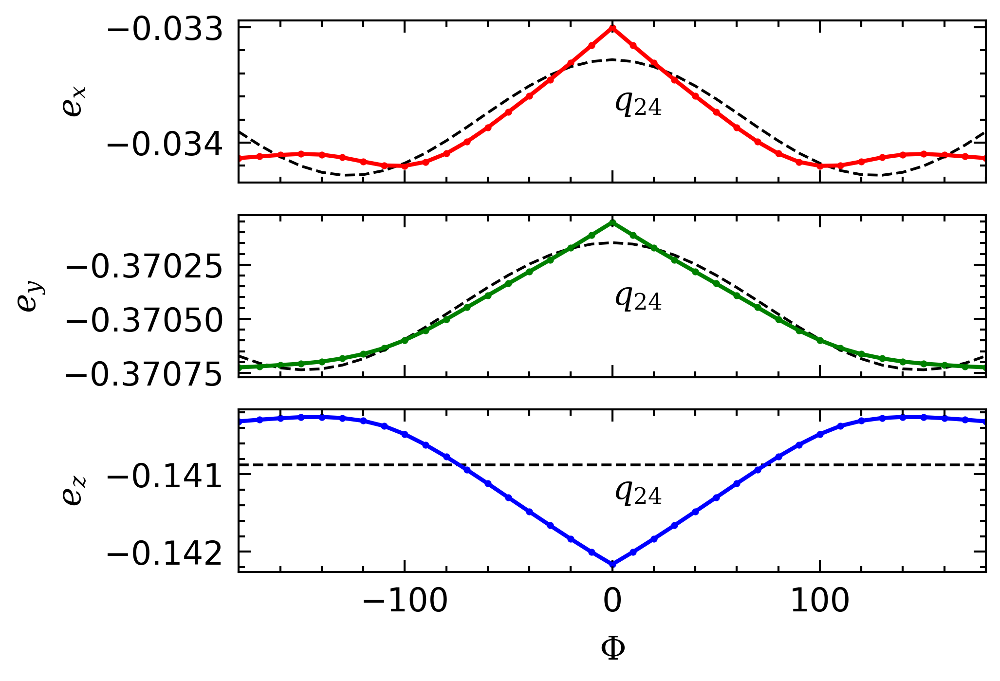

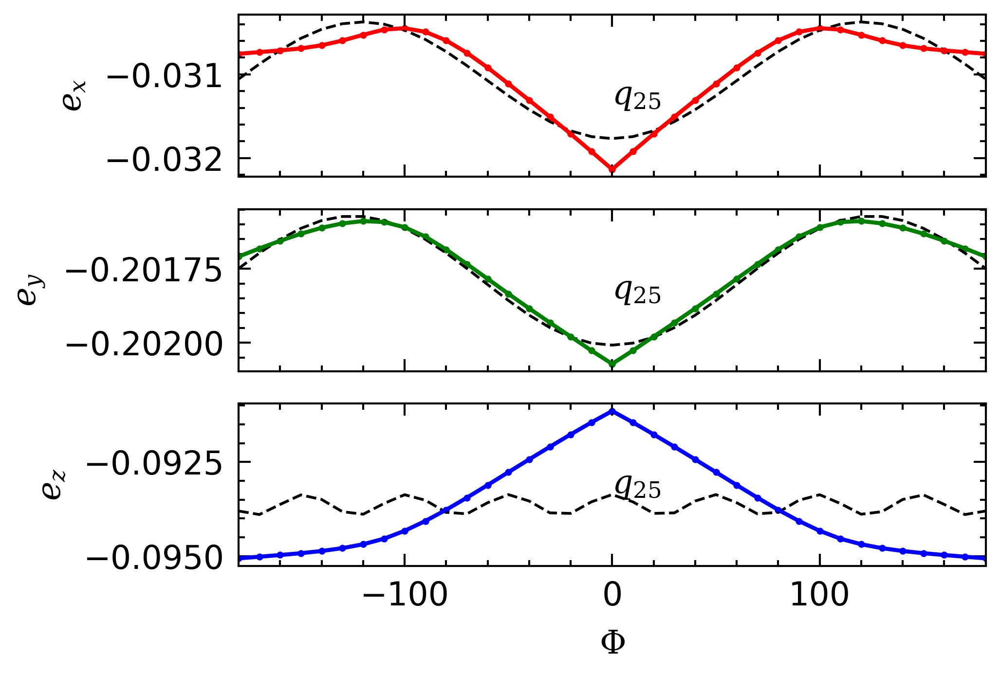

In [372]:
# for i in [1]:
#     plot_charge(i, df_f_sym_concat)
for i in range(25):
    plot_charge(i, df_f_sym_concat, "f")
for i in range(25):
    plot_charge(i, df_b_sym_concat, "b")
for i in range(25):
    plot_charge(i, df_average_sym_concat, "a")

In [9]:
back = "fbuta-neg-5"
foward = "fbuta-5"

sym = {}


for i in range(36):
    
    j = i + 1
    fpath = foward + "/" + f"{i}_{j}/local_fbuta-5-{i}-{j}.xyz"
    #print(fpath)
    f = open(fpath).readlines()
    forwards = [[float(x.split()[1]), float(x.split()[2]), float(x.split()[3])] for x in f[3:]]
    
    i = 35 - i 
    j = i + 1
    bpath = back + "/" + f"{i}_{j}/local_fbuta-neg-5-{i}-{j}.xyz"
    #print(bpath)
    f = open(bpath).readlines()
    backwards = [[float(x.split()[1]), float(x.split()[2]), float(x.split()[3])] for x in f[3:]]
    #print()
    
    sym[abs(i - 36)] = [forwards, backwards]
    

In [10]:
distance_sums = []
for key, value in sym.items():
    distances = []
    for c_a, c_b in zip(*value):
        c_a  = np.array(c_a)
        c_b  = np.array(c_b)
        #print(c_a - c_b)
        d = distance.euclidean(c_a, c_b)
        distances.append(d)
    
    distance_sums.append(sum(distances))
    

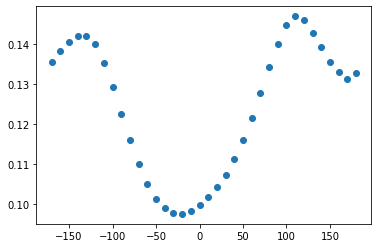

In [11]:
plt.scatter(dih_fbuta[:-1], distance_sums)

In [12]:
a,b = sym[1]


In [136]:
df_average

,dih,x_c0,x_c1,x_c2,x_c3,x_c4,x_c5,x_c6,x_c7,x_c8,...,z_c15,z_c16,z_c17,z_c18,z_c19,z_c20,z_c21,z_c22,z_c23,z_c24
0,-170,0.066510,-0.170211,-0.082521,-0.514756,-0.235788,0.033490,-0.158188,-0.067243,-0.187474,...,0.296398,-0.401871,-0.227696,0.220456,-0.488249,-0.126888,0.103545,-0.036337,-0.141232,-0.092505
1,-160,0.066439,-0.170187,-0.082544,-0.514801,-0.235742,0.033318,-0.158033,-0.067054,-0.187674,...,0.296497,-0.401741,-0.227819,0.220435,-0.488311,-0.126813,0.103471,-0.036274,-0.141306,-0.092406
2,-150,0.066367,-0.170165,-0.082568,-0.514841,-0.235701,0.033134,-0.157863,-0.066850,-0.187894,...,0.296616,-0.401598,-0.227957,0.220413,-0.488375,-0.126735,0.103393,-0.036207,-0.141381,-0.092304
3,-140,0.066299,-0.170148,-0.082592,-0.514874,-0.235669,0.032938,-0.157682,-0.066630,-0.188133,...,0.296757,-0.401437,-0.228114,0.220393,-0.488433,-0.126665,0.103322,-0.036148,-0.141459,-0.092198
4,-130,0.066240,-0.170132,-0.082612,-0.514900,-0.235644,0.032732,-0.157498,-0.066395,-0.188386,...,0.296921,-0.401261,-0.228286,0.220379,-0.488480,-0.126610,0.103265,-0.036103,-0.141537,-0.092088
5,-120,0.066196,-0.170118,-0.082626,-0.514917,-0.235629,0.032535,-0.157331,-0.066167,-0.188631,...,0.297097,-0.401079,-0.228462,0.220374,-0.488511,-0.126575,0.103229,-0.036075,-0.141614,-0.091979
6,-110,0.066160,-0.170095,-0.082635,-0.514937,-0.235613,0.032339,-0.157187,-0.065943,-0.188865,...,0.297271,-0.400902,-0.228629,0.220373,-0.488537,-0.126547,0.103200,-0.036050,-0.141686,-0.091872
7,-100,0.066126,-0.170067,-0.082644,-0.514965,-0.235594,0.032109,-0.157047,-0.065689,-0.189118,...,0.297459,-0.400701,-0.228808,0.220377,-0.488548,-0.126535,0.103185,-0.036040,-0.141761,-0.091757
8,-90,0.066092,-0.170033,-0.082652,-0.515003,-0.235565,0.031862,-0.156911,-0.065422,-0.189375,...,0.297652,-0.400486,-0.228995,0.220385,-0.488540,-0.126540,0.103189,-0.036046,-0.141837,-0.091640
9,-80,0.066060,-0.169997,-0.082659,-0.515047,-0.235529,0.031610,-0.156775,-0.065151,-0.189628,...,0.297845,-0.400266,-0.229188,0.220398,-0.488515,-0.126562,0.103212,-0.036073,-0.141911,-0.091525


In [15]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

#%matplotlib widget

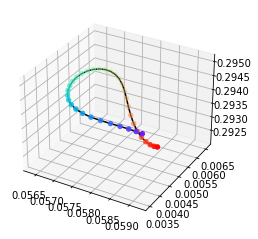

In [16]:
my_cmap = plt.get_cmap("rainbow")

colors = my_cmap(np.linspace(0, 1, 37))

n = 9
show = [n]#, 7, 8, 9]
for n in show:
    fancy_c = []
    x1 = []
    y1 = []
    z1 = []
    x2 = []
    y2 = []
    z2 = []
    x3 = []
    y3 = []
    z3 = []

    for i in range(1,37):
        a,b = sym[i]
        a = a[n]
        b = b[n]
        c = [(a[0] + b[0])/2, (a[1] + b[1])/2, (a[2] + b[2])/2]
        x1.append(a[0])
        x2.append(b[0])
        x3.append(c[0])

        y1.append(a[1])
        y2.append(b[1])
        y3.append(c[1])

        z1.append(a[2])
        z2.append(b[2])
        z3.append(c[2])

        fancy_c.append(colors[i])

    maxx = max(x3)
    maxy = max(y3)
    maxz = max(z3)
    minx = min(x3)
    miny = min(y3)
    minz = min(z3)
    
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    #ax.set_title(f"{ maxx-minx, maxy - miny, maxz - minz }")
    # ax.scatter(x1,y1,z1, color=fancy_c)
    # fancy_c.reverse()
    # ax.scatter(x2,y2,z2, color=fancy_c)
    ax.scatter(x3,y3,z3, color=fancy_c)
    ax.plot(x3,y3,z3, color="k")
    A = np.array([*zip(x3, y3, z3)])
    
    X=np.array(x3)
    Y=np.array(y2)
    Z=np.array(z3)
    # Create cubic bounding box to simulate equal aspect ratio
    max_range = np.array([X.max()-X.min(), Y.max()-Y.min(), Z.max()-Z.min()]).max()
    Xb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][0].flatten() + 0.5*(X.max()+X.min())
    Yb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][1].flatten() + 0.5*(Y.max()+Y.min())
    Zb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][2].flatten() + 0.5*(Z.max()+Z.min())
    # Comment or uncomment following both lines to test the fake bounding box:
    for xb, yb, zb in zip(Xb, Yb, Zb):
       ax.plot([xb], [yb], [zb], 'w')

    plt.grid()
    #plt.show()

#     def func(data, a, b):
#         return data[:,0]*data[:,1]*a + b
#     #          x * y * a + b
#     guess = (1,1)
#     params, pcov = optimize.curve_fit(func, A[:,:2], A[:,2], guess)
#     print(params)
    
#     zn = []
#     xn = []
#     yn = []
    
#     for x in np.arange(min(x3), max(x3), 0.0001):
#         for y in np.arange(min(y3), max(y3), 0.0001):
#             xn.append(x)
#             yn.append(y)
#             zn.append(y*x*params[0]+params[1])

#     ax.plot(xn,yn,zn, color="g")
    






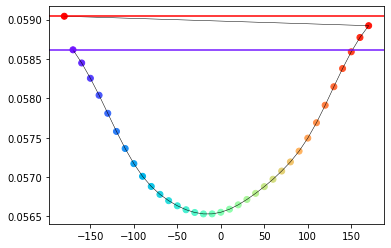

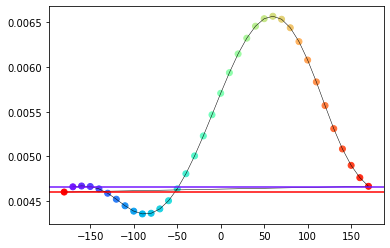

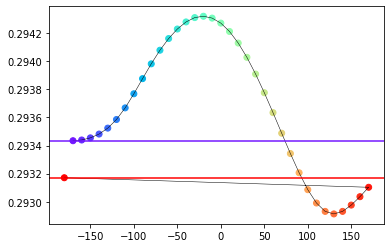

In [18]:

def plot_dif(x3):
    plt.clf()
    plt.scatter(dih_fbuta[1:], x3, color=fancy_c)
    plt.plot(dih_fbuta[1:], x3, color="k", linewidth=0.5)
    plt.axhline([x3[0]], color=fancy_c[0])
    plt.axhline([x3[-1]], color=fancy_c[-1])
    plt.show()
    
plot_dif(x3)
plot_dif(y3)
plot_dif(z3)